# Infosys Stock Price Prediction

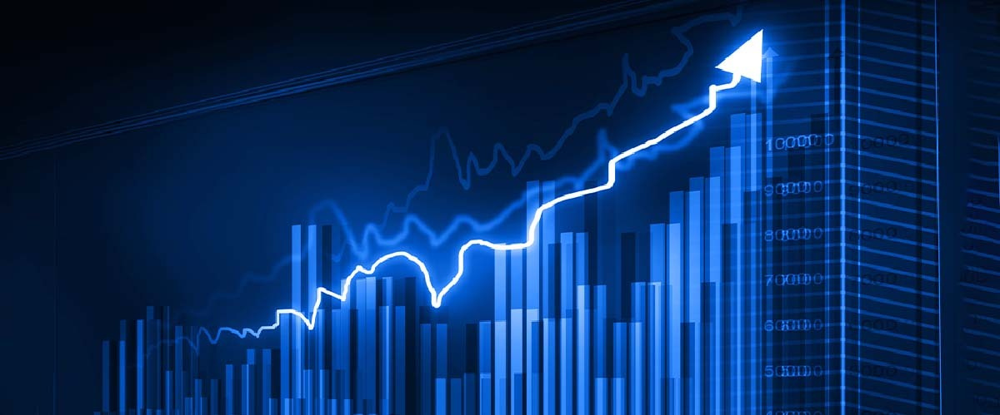

In [4]:
!pip install yfinance
!pip install pandas_datareader

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 4.0 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.5/73.5 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.2/112.2 kB 3.8 MB/s eta 0:00:00
  Created wheel for peewee: filename=peewee-3.17.6-cp311-cp311-macosx_10_9_x86_64.whl size=253001 sha256=0e9757e0e4468b6dd93856f24dd3949a33e87fb4e6bc6792a7e9984284322898
  Stored in directory: /Users/ajay/Library/Caches/pip/wheels/1c/09/7e/9f659fde248ecdc1722a142c1d744271aad3914a0afc191058
Successfully built peewee
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 109.5/109.5 kB 2.1 MB/s eta 0:00:00a 0:00:01


In [8]:
!pip install --upgrade yfinance

In [178]:
!pip install prophet


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.8/8.8 MB 8.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.5/94.5 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 8.4 MB/s eta 0:00:00:00:0100:01


In [181]:
!pip install colorama


## Importing necessary libraries

In [210]:
import pandas as pd
import numpy as np
from datetime import datetime

# For reading stock data from yahoo
from pandas_datareader.data import DataReader
import yfinance as yf
from pandas_datareader import data as pdr

# For PLotting we will use these library
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import cycle
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

import math
import sklearn
import sklearn.preprocessing
import datetime
import os
import matplotlib.pyplot as plt
import tensorflow as tf

# For Evalution we will use these library
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score 
from sklearn.metrics import mean_poisson_deviance, mean_gamma_deviance, accuracy_score
from sklearn.preprocessing import MinMaxScaler,RobustScaler,StandardScaler

# For model building we will use these library
import statsmodels.api as sm
from statsmodels.tsa.stattools import acf,pacf,adfuller
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX

from colorama import Fore, Style
from prophet import Prophet

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.layers import LSTM,GRU

from warnings import filterwarnings
filterwarnings('ignore')

## Importing Historical Data from yahoo finance

In [2]:
# Define the ticker symbol for Infosys
ticker = "INFY.NS"  # ".NS" is used to specify that the stock is listed on the NSE (National Stock Exchange of India)

# Define the start and end dates
start_date = "1996-01-01"
end_date = "2024-08-15"  # Use the current date

# Fetch the data directly using yfinance
infosys_data = yf.download(ticker, start=start_date, end=end_date)

# Display the first few rows of the data
print(infosys_data.head())

# Save the data to a CSV file (optional)
infosys_data.to_csv('Infosys_stock_data_NSE.csv')

[*********************100%%**********************]  1 of 1 completed

                Open      High       Low     Close  Adj Close  Volume
Date                                                                 
1996-01-01  0.794921  0.796679  0.791015  0.796679   0.516419  204800
1996-01-02  0.794921  0.798828  0.793457  0.793457   0.514330  204800
1996-01-03  0.798828  0.798828  0.798828  0.798828   0.517812  102400
1996-01-04  0.791015  0.794921  0.791015  0.793554   0.514393  307200
1996-01-05  0.784179  0.784179  0.784179  0.784179   0.508316   51200


### Loading the dataset

In [3]:
df=pd.read_csv('Infosys_stock_data_NSE.csv')
df

,Date,Open,High,Low,Close,Adj Close,Volume
0,1996-01-01,0.794921,0.796679,0.791015,0.796679,0.516419,204800
1,1996-01-02,0.794921,0.798828,0.793457,0.793457,0.514330,204800
2,1996-01-03,0.798828,0.798828,0.798828,0.798828,0.517812,102400
3,1996-01-04,0.791015,0.794921,0.791015,0.793554,0.514393,307200
4,1996-01-05,0.784179,0.784179,0.784179,0.784179,0.508316,51200
...,...,...,...,...,...,...,...
7185,2024-08-08,1779.949951,1779.949951,1727.099976,1743.150024,1743.150024,6227910
7186,2024-08-09,1771.250000,1780.750000,1756.000000,1770.750000,1770.750000,4258524
7187,2024-08-12,1773.050049,1803.500000,1768.099976,1797.400024,1797.400024,4315329
7188,2024-08-13,1810.000000,1810.000000,1789.050049,1797.449951,1797.449951,4176918


## Data Description

In [4]:
df.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], dtype='object')

In [5]:
info_dict={
    'Columns':df.columns.to_list(),
    'Not_null_counts':df.count().to_list(),
    'Dtype':df.dtypes.to_list(),
    'Null_Percentage':np.round((7190-df.count())*100/7190)  
}
Data_description=pd.DataFrame(info_dict).reset_index(drop=True)
Data_description

,Columns,Not_null_counts,Dtype,Null_Percentage
0,Date,7190,object,0.0
1,Open,7190,float64,0.0
2,High,7190,float64,0.0
3,Low,7190,float64,0.0
4,Close,7190,float64,0.0
5,Adj Close,7190,float64,0.0
6,Volume,7190,int64,0.0


# Exploratory Data Analysis

Exploratory Data Analysis (EDA), also known as Data Exploration, it is a step in the Data Analysis Process, where a number of techniques are used to better understand the dataset being used.

In this step, we will perform the below operations:

### 3.1) understanding Your Variables
        3.1.1) Head of the dataset
        3.1.2) The shape of the dataset
        3.1.3) List types of all columns
        3.1.4) Info of the dataset
        3.1.5) Summary of the dataset
### 3.2) Data Cleaning
        3.2.1) Checking the Duplicates
        3.2.2) Check the Null values

### 3.1.1 Head of the dataset

In [6]:
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,1996-01-01,0.794921,0.796679,0.791015,0.796679,0.516419,204800
1,1996-01-02,0.794921,0.798828,0.793457,0.793457,0.514330,204800
2,1996-01-03,0.798828,0.798828,0.798828,0.798828,0.517812,102400
3,1996-01-04,0.791015,0.794921,0.791015,0.793554,0.514393,307200
4,1996-01-05,0.784179,0.784179,0.784179,0.784179,0.508316,51200


### 3.1.2. The shape of the dataset

In [7]:
df.shape

(7190, 7)

### 3.1.3. List types of all columns

In [8]:
df.dtypes

Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close    float64
Volume         int64
dtype: object

#### Coverting Date dtype into Date format

In [9]:
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')

### 3.1.4. Info of the dataset

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7190 entries, 0 to 7189
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       7190 non-null   datetime64[ns]
 1   Open       7190 non-null   float64       
 2   High       7190 non-null   float64       
 3   Low        7190 non-null   float64       
 4   Close      7190 non-null   float64       
 5   Adj Close  7190 non-null   float64       
 6   Volume     7190 non-null   int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 393.3 KB


### 3.1.5. Summary of the dataset

In [11]:
df.describe()

,Date,Open,High,Low,Close,Adj Close,Volume
count,7190,7190.000000,7190.000000,7190.000000,7190.000000,7190.000000,7.190000e+03
mean,2010-02-16 11:32:09.680111360,434.853302,439.549396,429.960875,434.760129,378.901642,1.445725e+07
min,1996-01-01 00:00:00,0.763183,0.765625,0.712890,0.763183,0.494706,0.000000e+00
25%,2002-11-20 06:00:00,80.410156,81.857422,78.789062,80.192385,54.036963,5.688962e+06
50%,2010-01-18 12:00:00,289.375000,291.625000,285.078125,288.915634,216.059166,8.894290e+06
75%,2017-05-04 18:00:00,554.000000,562.787521,548.706238,554.575012,447.856041,1.686939e+07
max,2024-08-14 00:00:00,1938.550049,1953.900024,1930.500000,1939.500000,1878.900024,2.766150e+08
std,NaN,474.305697,478.475832,469.897333,474.215284,462.538663,1.561829e+07


## 3.2 Data Cleaning

### 3.2.1. Checking the Duplicates

In [12]:
df[df.duplicated]

,Date,Open,High,Low,Close,Adj Close,Volume


No duplicates

### 3.2.2 Checking null values

In [13]:
df.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

#### There are no null values

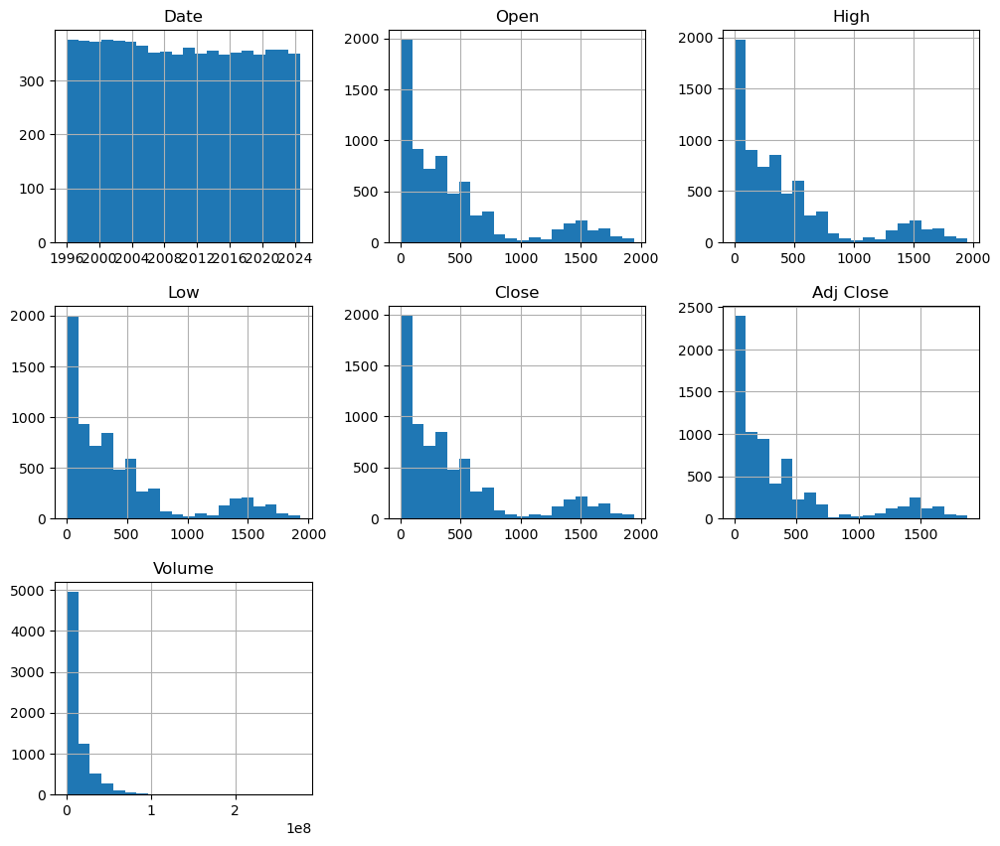

In [14]:
df.hist(figsize=(12, 10), bins=20)
plt.show()

## Analysing Numerical Features

In [15]:
num=df.columns.to_list()
num

['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']

In [16]:
num.remove('Date')

In [17]:
num

['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']

Open
5736
Axes(0.125,0.11;0.775x0.77)


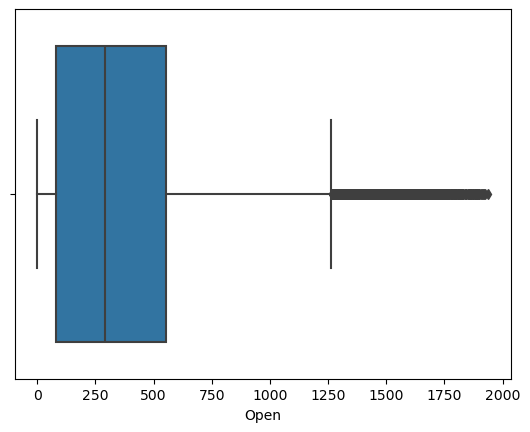

Axes(0.125,0.11;0.775x0.77)


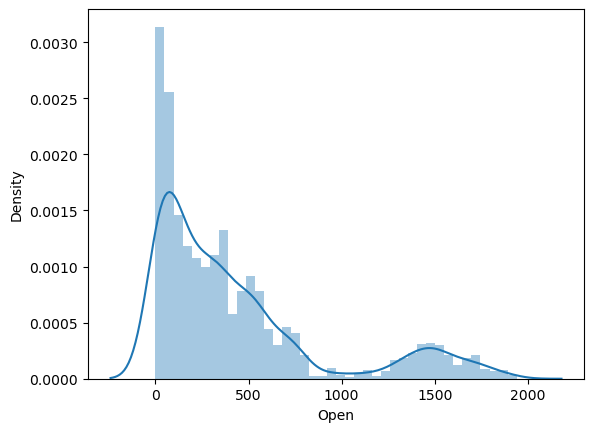

High
6195
Axes(0.125,0.11;0.775x0.77)


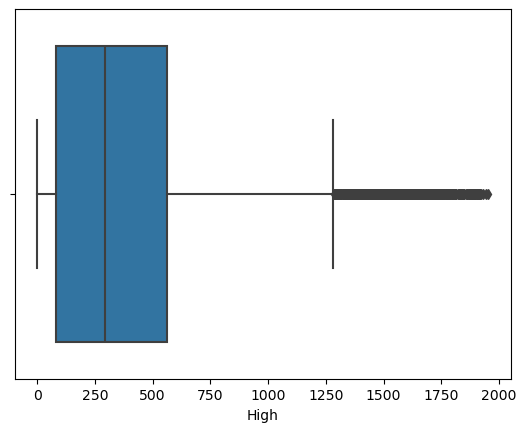

Axes(0.125,0.11;0.775x0.77)


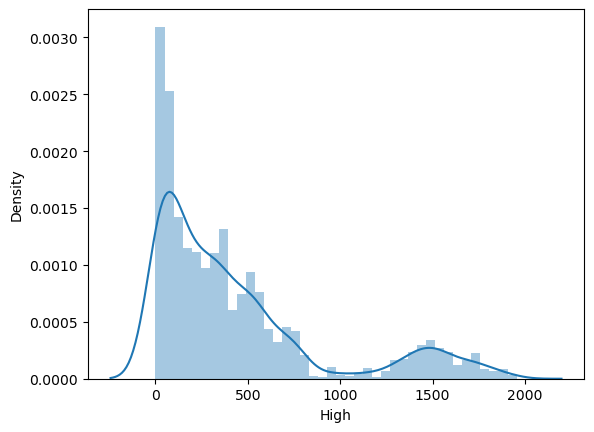

Low
6406
Axes(0.125,0.11;0.775x0.77)


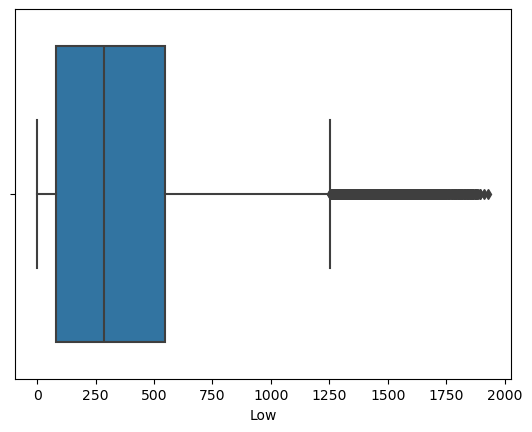

Axes(0.125,0.11;0.775x0.77)


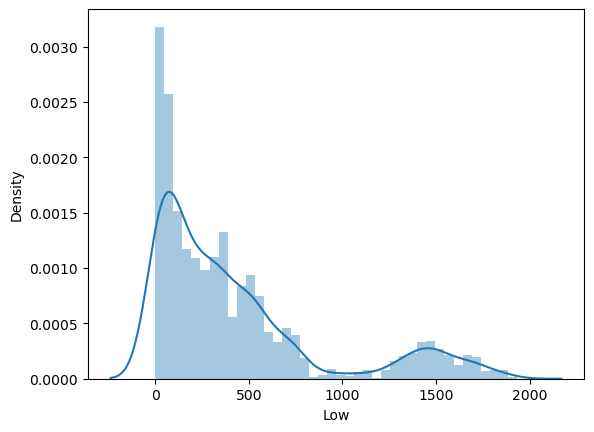

Close
6854
Axes(0.125,0.11;0.775x0.77)


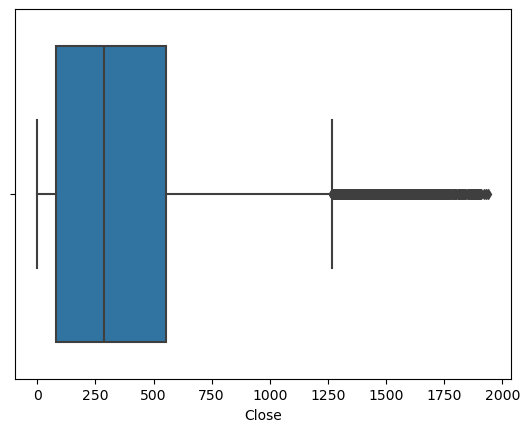

Axes(0.125,0.11;0.775x0.77)


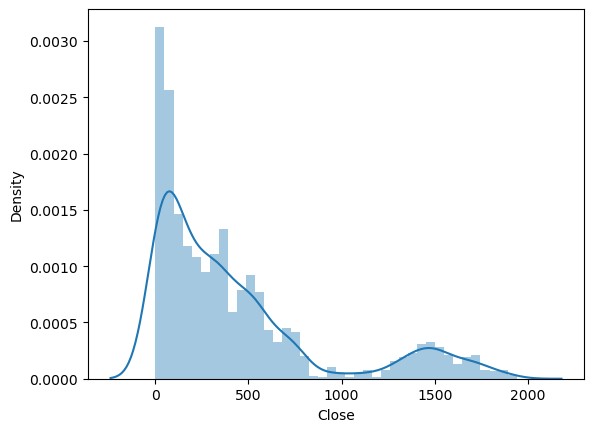

Adj Close
6985
Axes(0.125,0.11;0.775x0.77)


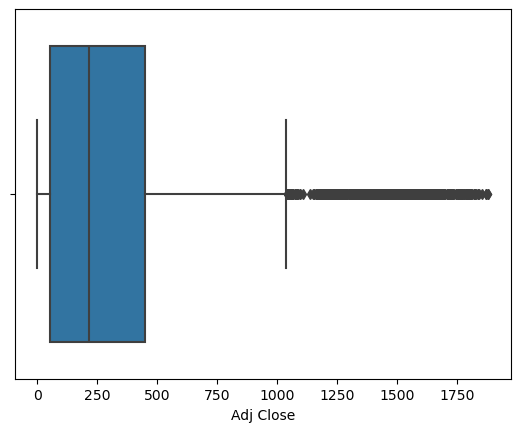

Axes(0.125,0.11;0.775x0.77)


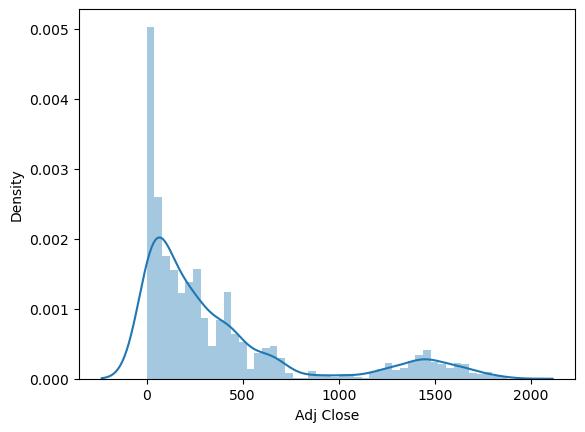

Volume
6718
Axes(0.125,0.11;0.775x0.77)


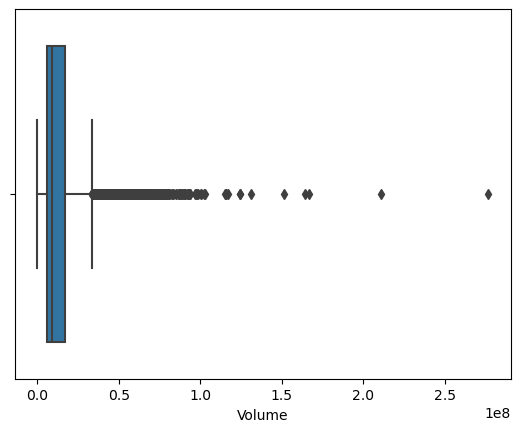

Axes(0.125,0.11;0.775x0.77)


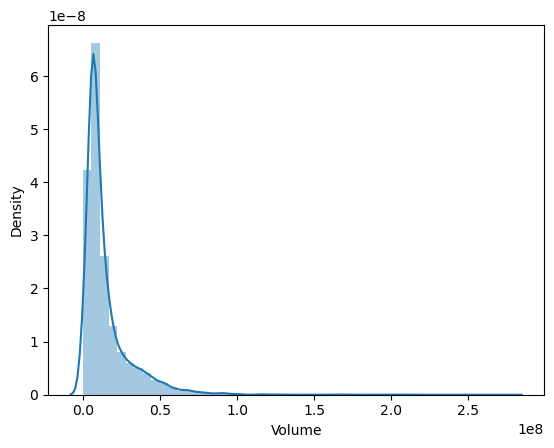

In [18]:
for i in num:
    print(i)
    print(df[i].nunique())
    print(sns.boxplot(x=df[i]))
    plt.show()
    print(sns.distplot(df[i]))
    plt.show()

#### Starting and Ending date of dataset

In [19]:
Starting_Date=df.iloc[0][0]
Ending_Date=df.iloc[-1][0]
#Duration=df.iloc[-1][0]-df.iloc[0][0]

print('Starting Date',Starting_Date)
print('Ending Date',Ending_Date)
print("Duration: ", df.iloc[-1][0]-df.iloc[0][0])


Starting Date 1996-01-01 00:00:00
Ending Date 2024-08-14 00:00:00
Duration:  10453 days 00:00:00


In [20]:
n_rows = df.shape[0]

date_range = pd.date_range(start=start_date, periods=n_rows, freq='D')

In [21]:
df_copy=df.copy(deep=True)
df=df.set_index('Date')
df

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
1996-01-01,0.794921,0.796679,0.791015,0.796679,0.516419,204800
1996-01-02,0.794921,0.798828,0.793457,0.793457,0.514330,204800
1996-01-03,0.798828,0.798828,0.798828,0.798828,0.517812,102400
1996-01-04,0.791015,0.794921,0.791015,0.793554,0.514393,307200
1996-01-05,0.784179,0.784179,0.784179,0.784179,0.508316,51200
...,...,...,...,...,...,...
2024-08-08,1779.949951,1779.949951,1727.099976,1743.150024,1743.150024,6227910
2024-08-09,1771.250000,1780.750000,1756.000000,1770.750000,1770.750000,4258524
2024-08-12,1773.050049,1803.500000,1768.099976,1797.400024,1797.400024,4315329


## Data Visualization

### Closing Price
The closing price is the last price at which the stock is traded during the regular trading day. A stock’s closing price is the standard benchmark used by investors to track its performance over time.

#### Historical view of the closing price


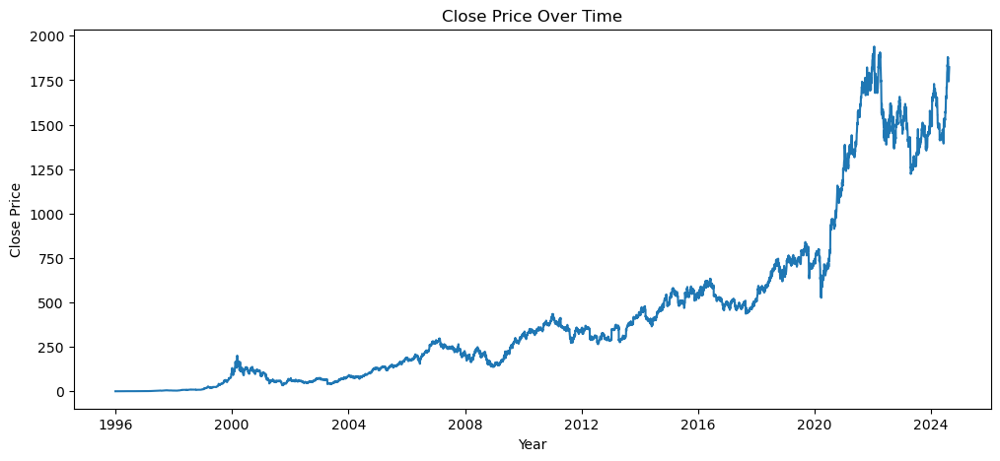

In [22]:
# Historical view of the closing price
plt.figure(figsize=(12,5))
plt.plot(df.Close)
plt.xlabel('Year')
plt.ylabel('Close Price')
plt.title('Close Price Over Time')
plt.show()

#### Historical view of the opening price


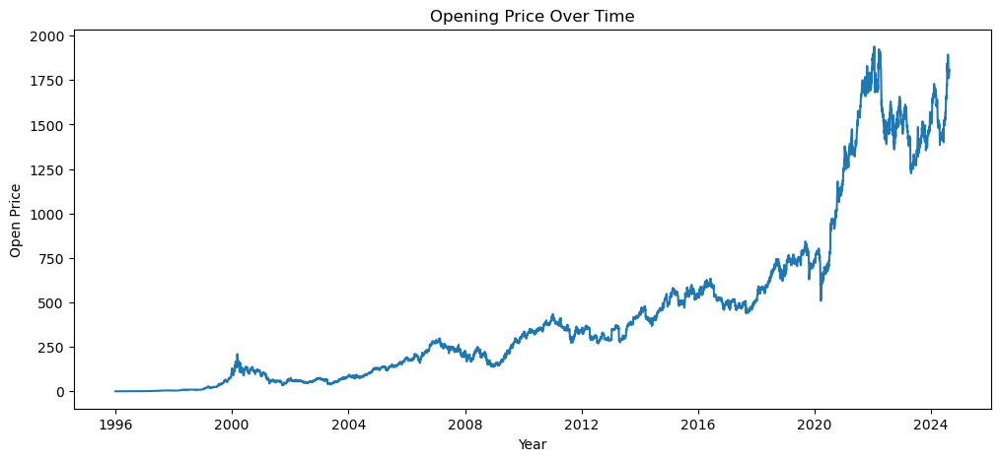

In [23]:
# Historical view of the opening price
plt.figure(figsize=(12,5))
plt.plot(df.Open)
plt.xlabel('Year')
plt.ylabel('Open Price')
plt.title('Opening Price Over Time')
plt.show()

#### Historical view of the highest price


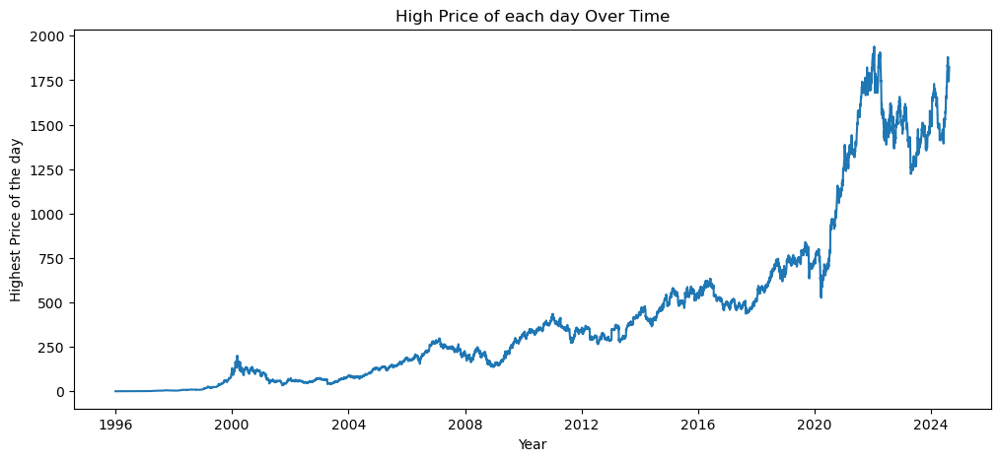

In [24]:
# Historical view of the highest price
plt.figure(figsize=(12,5))
plt.plot(df.Close)
plt.xlabel('Year')
plt.ylabel('Highest Price of the day')
plt.title('High Price of each day Over Time')
plt.show()

#### Historical view of the low price of the day


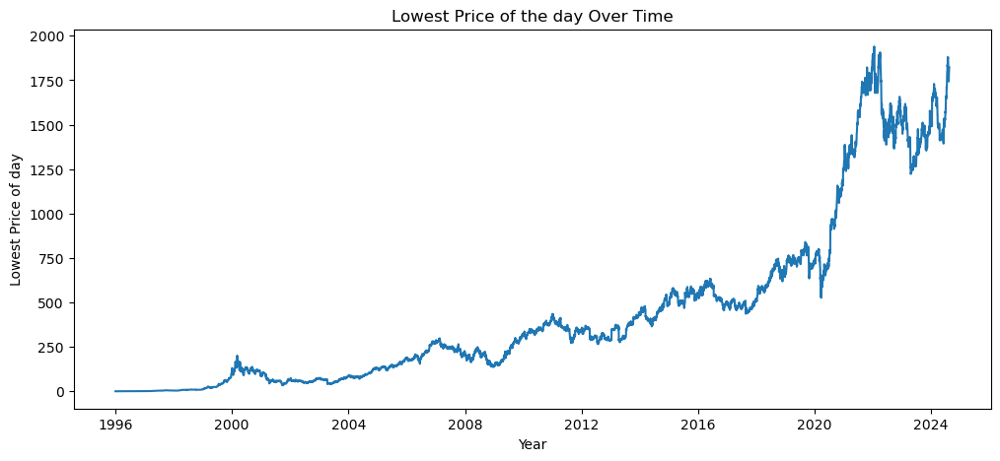

In [25]:
# Historical view of the lowest price
plt.figure(figsize=(12,5))
plt.plot(df.Close)
plt.xlabel('Year')
plt.ylabel('Lowest Price of day')
plt.title('Lowest Price of the day Over Time')
plt.show()

In [26]:
df1=df_copy.copy(deep=True)

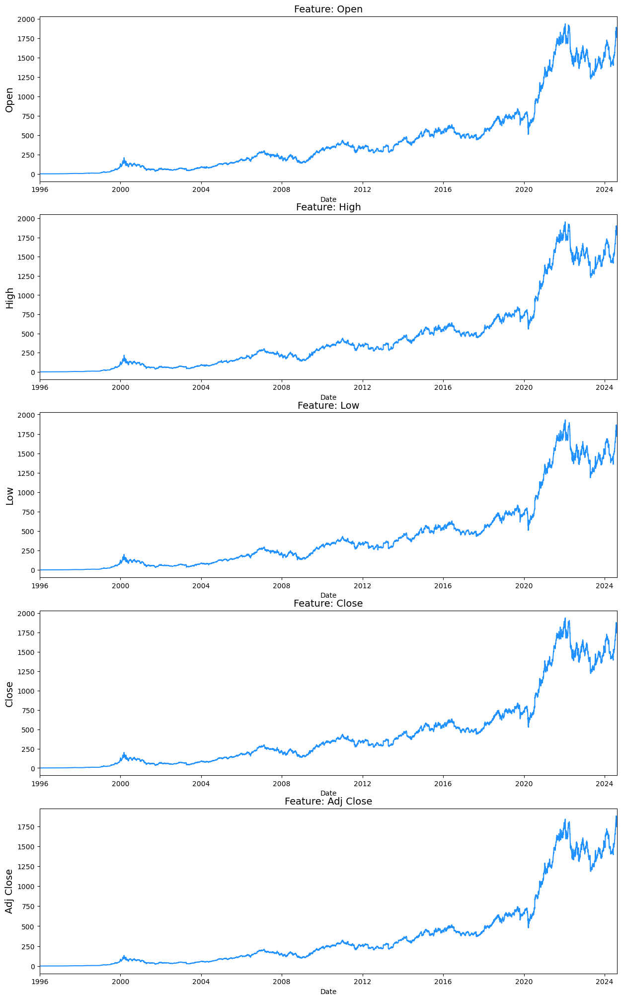

In [27]:
# To compelte the data, as naive method, we will use ffill
f, ax = plt.subplots(nrows=5, ncols=1, figsize=(15, 25))

for i, column in enumerate(df1.drop(['Date','Volume'] ,axis=1).columns):
    sns.lineplot(x=df1['Date'], y=df1[column].fillna(method='ffill'), ax=ax[i], color='dodgerblue')
    ax[i].set_title('Feature: {}'.format(column), fontsize=14)
    ax[i].set_ylabel(ylabel=column, fontsize=14)
                      
    ax[i].set_xlim([Starting_Date, Ending_Date])  

IndexError: index 5 is out of bounds for axis 0 with size 5

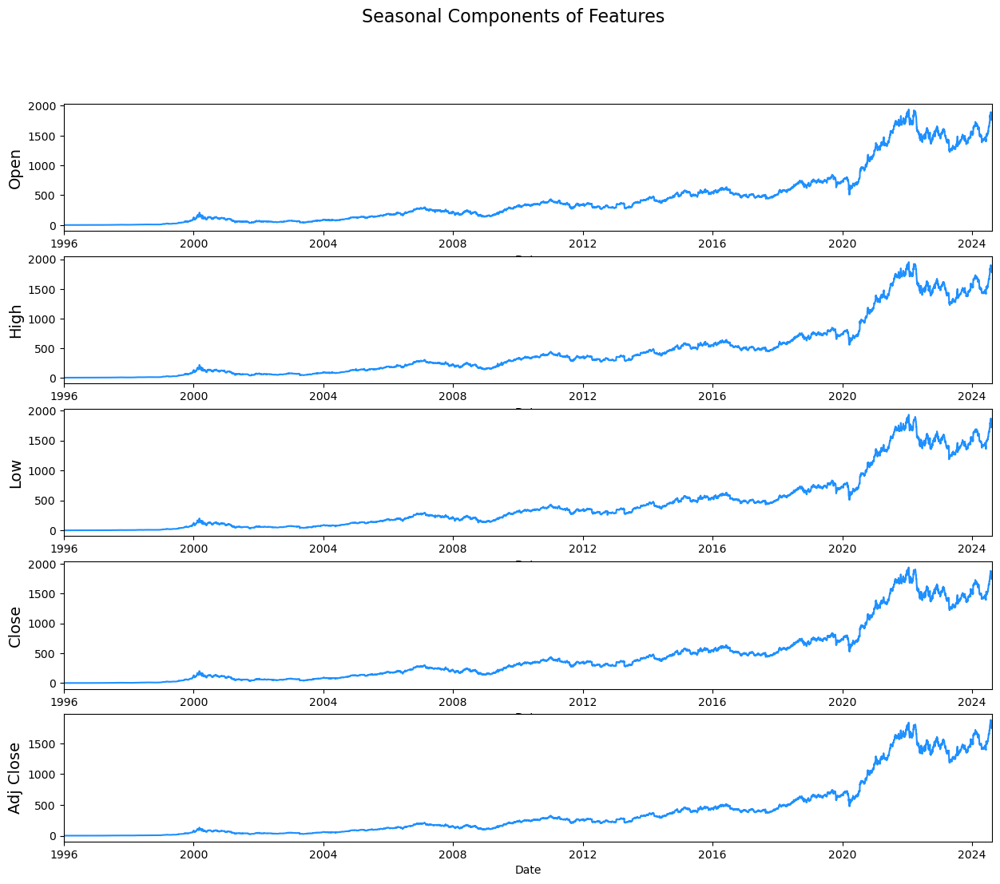

In [28]:
df2=df_copy.drop('Volume',axis=1)
f, ax = plt.subplots(nrows=5, ncols=1, figsize=(15, 12))
f.suptitle('Seasonal Components of Features', fontsize=16)

for i, column in enumerate(num):
    sns.lineplot(x=df_copy['Date'], y=df_copy[column], ax=ax[i], color='dodgerblue')
    ax[i].set_ylabel(ylabel=column, fontsize=14)
    ax[i].set_xlim([Starting_Date,Ending_Date])
    
plt.tight_layout()
plt.show()

### Volume of Sales¶
Volume is the amount of an asset or security that changes hands over some period of time, often over the course of a day. For instance, the stock trading volume would refer to the number of shares of security traded between its daily open and close. Trading volume, and changes to volume over the course of time, are important inputs for technical traders.

#### total volume of stock being traded each day

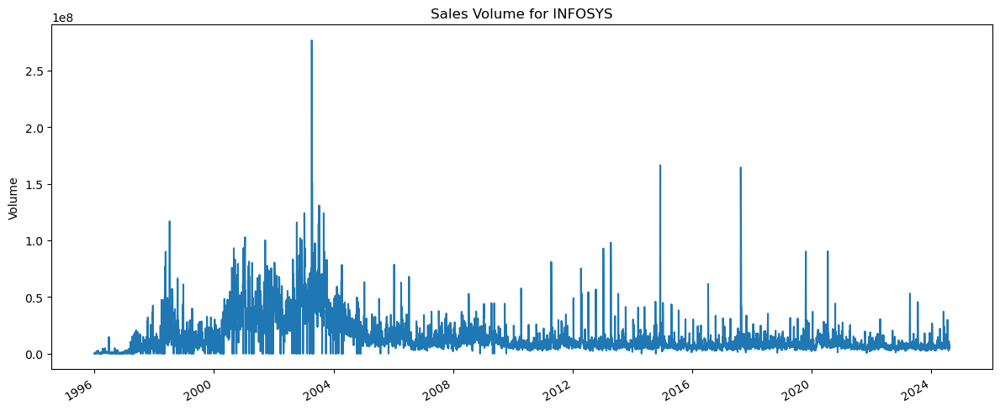

In [29]:
# Now let's plot the total volume of stock being traded each day
plt.figure(figsize=(12,5))
df['Volume'].plot()
plt.ylabel('Volume')
plt.xlabel(None)
plt.title(f"Sales Volume for INFOSYS")
plt.tight_layout()

### Daily return of the stock on average

Now that we've done some baseline analysis, let's go ahead and dive a little deeper. We're now going to analyze the risk of the stock. In order to do so we'll need to take a closer look at the daily changes of the stock, and not just its absolute value. Let's go ahead and use pandas to retrieve teh daily returns for the INFOSYS stock.

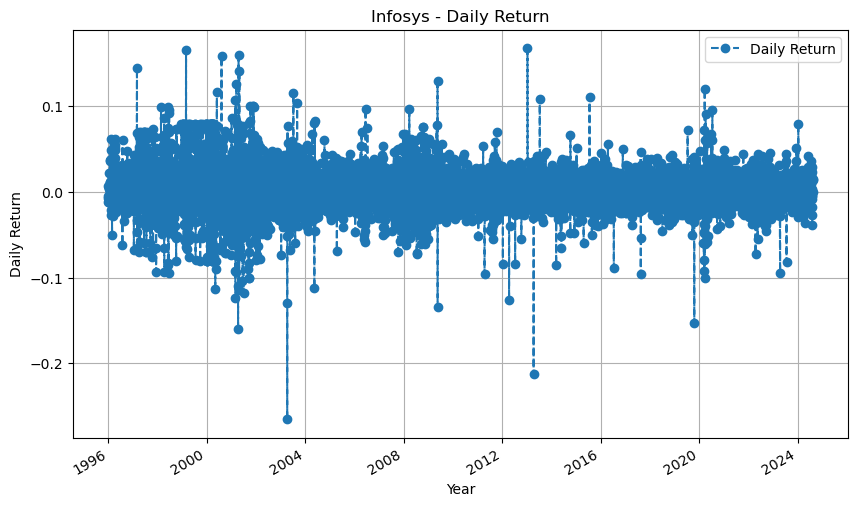

In [30]:
# We'll use pct_change to find the percent change for each day
df['Daily Return'] = df['Adj Close'].pct_change()

# Then we'll plot the daily return percentage
plt.figure(figsize=(10, 6))
df['Daily Return'].plot(legend=True, linestyle='--', marker='o')
plt.title('Infosys - Daily Return')
plt.xlabel('Year')
plt.ylabel('Daily Return')
plt.grid(True)
plt.show()

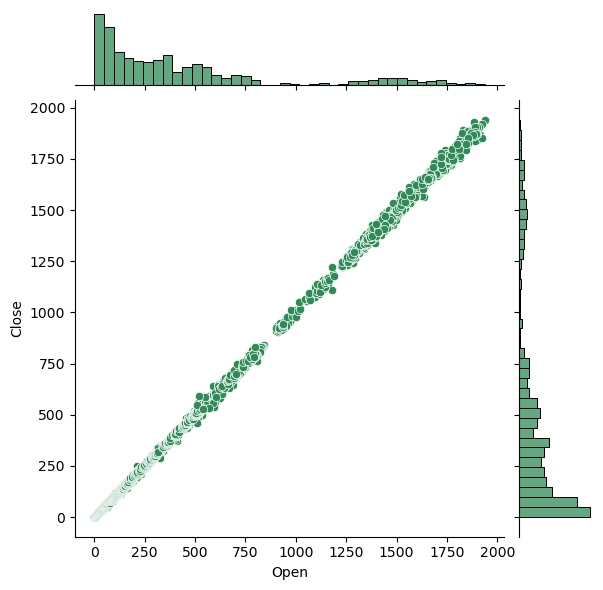

In [31]:
#Corelation between Open and Close
sns.jointplot(x=df.Open, y=df.Close, data=df, kind='scatter', color='seagreen')

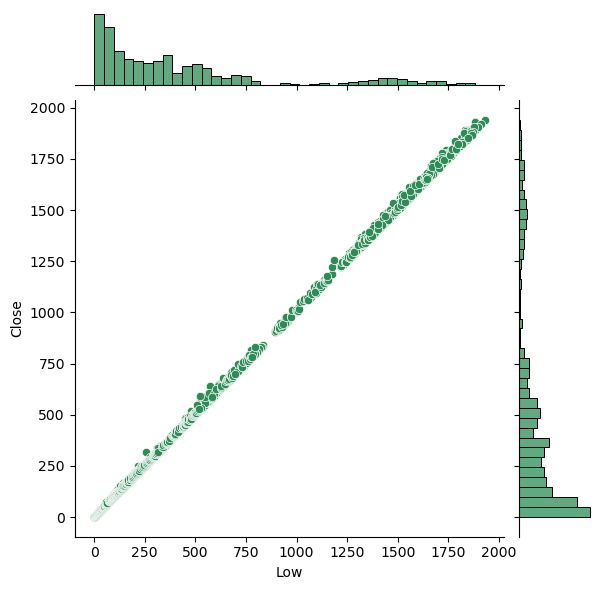

In [32]:
#Corelation between High and Close
sns.jointplot(x=df.Low, y=df.Close, data=df, kind='scatter', color='seagreen')

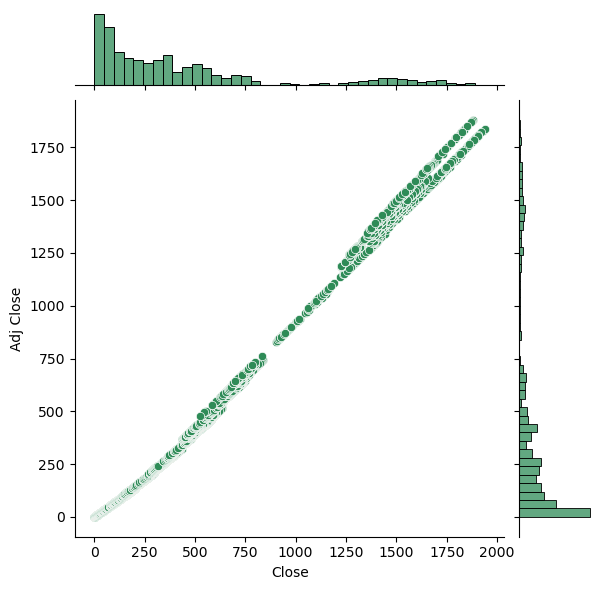

In [33]:
#Corelation between Close and Adj Close
sns.jointplot(x=df.Close, y=df['Adj Close'], data=df, kind='scatter', color='seagreen')

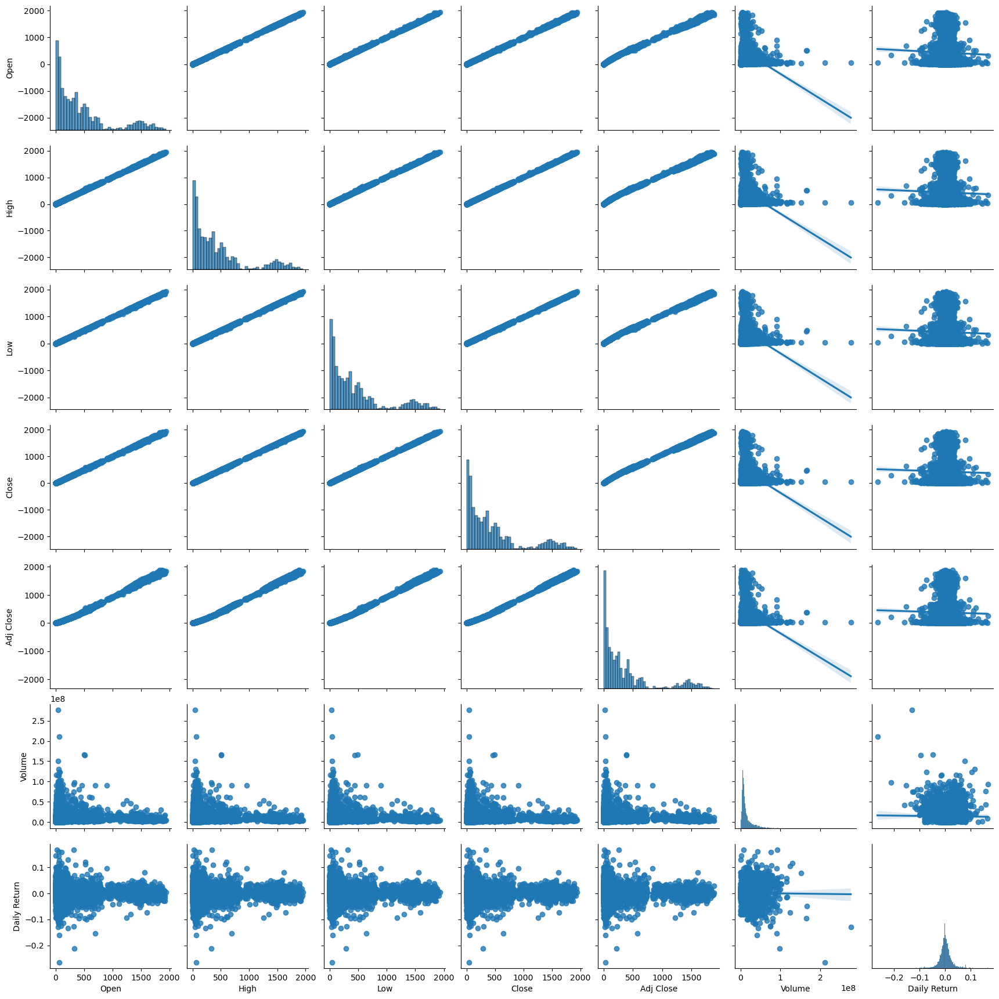

In [34]:
# We can simply call pairplot on our DataFrame for an automatic visual analysis of all the comparisons

sns.pairplot(df, kind='reg')

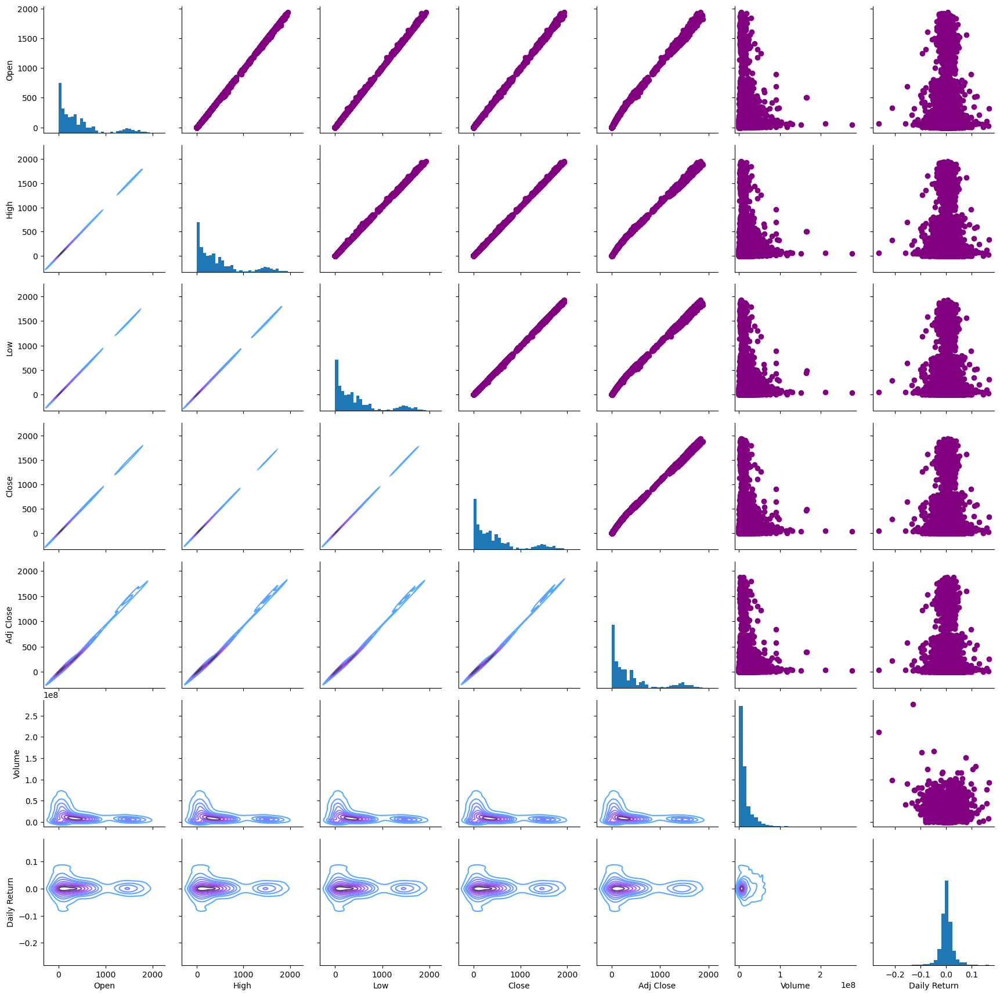

In [35]:
# Set up our figure by naming it returns_fig, call PairPLot on the DataFrame
return_fig = sns.PairGrid(df.dropna())

# Using map_upper we can specify what the upper triangle will look like.
return_fig.map_upper(plt.scatter, color='purple')

# We can also define the lower triangle in the figure, inclufing the plot type (kde) 
# or the color map (BluePurple)
return_fig.map_lower(sns.kdeplot, cmap='cool_d')

# Finally we'll define the diagonal as a series of histogram plots of the daily return
return_fig.map_diag(plt.hist, bins=30)

### Heatmap

Text(0.5, 1.0, 'Correlation of features')

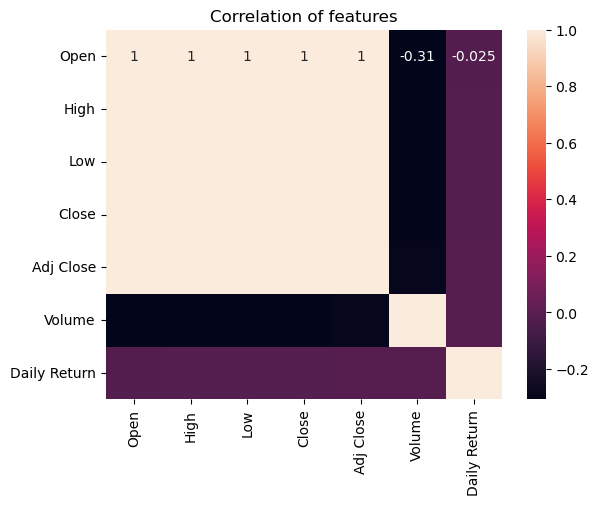

In [36]:
sns.heatmap(df.corr(), annot=True)
plt.title('Correlation of features')

### Monthwise comparision between Stock open and close price¶


In [40]:
monthvise= df_copy.groupby(df_copy['Date'].dt.strftime('%B'))[['Open','Close']].mean()
new_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 
             'September', 'October', 'November', 'December']
monthvise = monthvise.reindex(new_order, axis=0)
monthvise

,Open,Close
Date,,
January,443.451827,443.194796
February,458.098627,457.907673
March,439.497109,439.204348
April,415.377076,414.221075
May,414.351990,414.298378
June,428.352455,428.742345
July,447.916233,448.483723
August,442.320228,442.036781
September,425.759146,425.679791


In [41]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=monthvise.index,
    y=monthvise['Open'],
    name='Stock Open Price',
    marker_color='crimson'
))
fig.add_trace(go.Bar(
    x=monthvise.index,
    y=monthvise['Close'],
    name='Stock Close Price',
    marker_color='lightsalmon'
))

fig.update_layout(barmode='group', xaxis_tickangle=-45, 
                  title='Monthwise comparision between Stock open and close price')
fig.show()

#### Monthwise High and Low stock price

In [42]:
df_copy.groupby(df_copy['Date'].dt.strftime('%B'))['Low'].min()
monthvise_high = df_copy.groupby(df_copy['Date'].dt.strftime('%B'))['High'].max()
monthvise_high = monthvise_high.reindex(new_order, axis=0)

monthvise_low = df_copy.groupby(df_copy['Date'].dt.strftime('%B'))['Low'].min()
monthvise_low = monthvise_low.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthvise_high.index,
    y=monthvise_high,
    name='Stock high Price',
    marker_color='rgb(0, 153, 204)'
))
fig.add_trace(go.Bar(
    x=monthvise_low.index,
    y=monthvise_low,
    name='Stock low Price',
    marker_color='rgb(255, 128, 0)'
))

fig.update_layout(barmode='group', 
                  title=' Monthwise High and Low stock price')
fig.show()

### Trend comparision between stock open price, close price, high price, low price¶


In [43]:
names = cycle(['Stock Open Price','Stock Close Price','Stock High Price','Stock Low Price'])

fig = px.line(df_copy, x=df_copy.Date, y=[df_copy['Open'], df_copy['Close'], 
                                          df_copy['High'], df_copy['Low']],
             labels={'Date': 'Date','value':'Stock value'})
fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

### Univariant Analysis

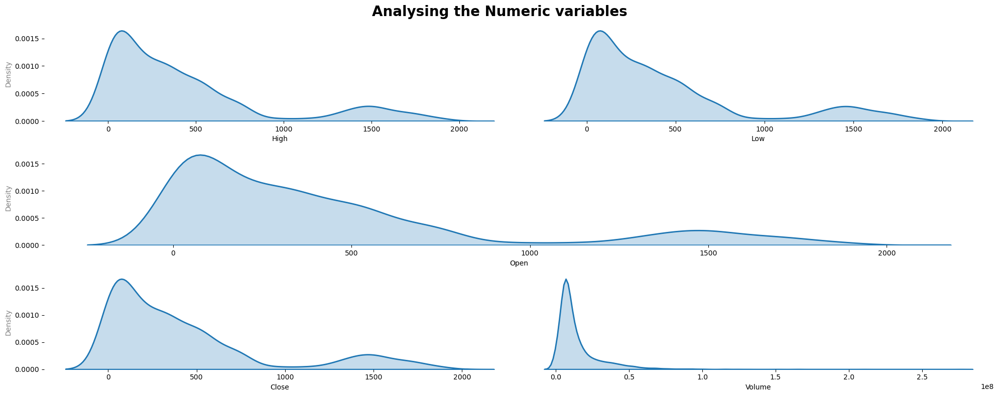

In [44]:
#integer columns
fig=plt.figure(figsize=(20,8), tight_layout=True)
plt.suptitle("Analysing the Numeric variables", size=20, weight='bold')
ax=fig.subplot_mosaic("""AB
                         CC
                         DE""")
sns.kdeplot(df['High'], ax=ax['A'], fill=True, linewidth=2)
sns.kdeplot(df['Low'], ax=ax['B'], fill=True, linewidth=2)
sns.kdeplot(df['Open'], ax=ax['C'], fill=True, linewidth=2)
sns.kdeplot(df['Close'], ax=ax['D'],fill=True, linewidth=2)
sns.kdeplot(df['Volume'], ax=ax['E'], fill=True, linewidth=2)
ax['B'].yaxis.set_visible(False)
ax['E'].yaxis.set_visible(False)
ax['A'].yaxis.label.set_alpha(0.5)
ax['C'].yaxis.label.set_alpha(0.5)
ax['A'].yaxis.label.set_alpha(0.5)
ax['C'].yaxis.label.set_alpha(0.5)
ax['D'].yaxis.label.set_alpha(0.5)
for s in ['left','right','top','bottom']:
    ax['A'].spines[s].set_visible(False)
    ax['B'].spines[s].set_visible(False)
    ax['C'].spines[s].set_visible(False)
    ax['D'].spines[s].set_visible(False)
    ax['E'].spines[s].set_visible(False)

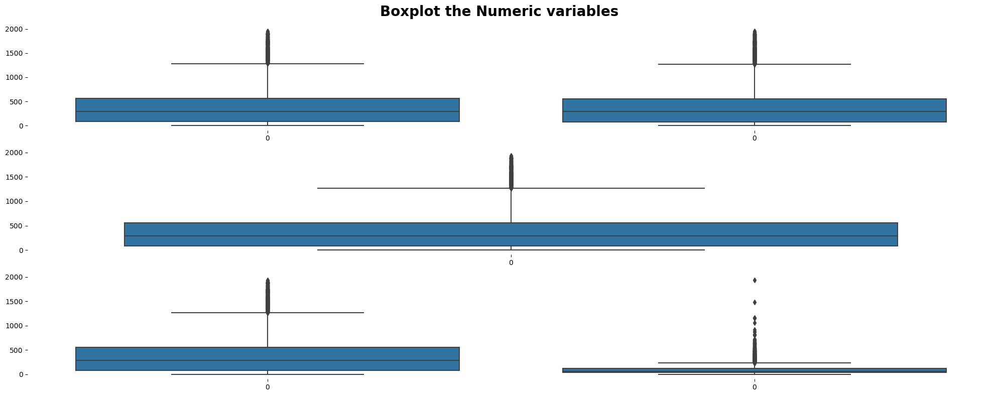

In [45]:
#integer columns
fig=plt.figure(figsize=(20,8), tight_layout=True)
plt.suptitle("Boxplot the Numeric variables", size=20, weight='bold')
ax=fig.subplot_mosaic("""AB
                         CC
                         DE""")
sns.boxplot(df['High'], ax=ax['A'])
sns.boxplot(df['Low'], ax=ax['B'])
sns.boxplot(df['Open'], ax=ax['C'])
sns.boxplot(df['Close'], ax=ax['D'])
sns.boxplot(df['Volume'], ax=ax['E'])
ax['B'].yaxis.set_visible(False)
ax['E'].yaxis.set_visible(False)
ax['A'].yaxis.label.set_alpha(0.5)
ax['C'].yaxis.label.set_alpha(0.5)
ax['A'].yaxis.label.set_alpha(0.5)
ax['C'].yaxis.label.set_alpha(0.5)
ax['D'].yaxis.label.set_alpha(0.5)
for s in ['left','right','top','bottom']:
    ax['A'].spines[s].set_visible(False)
    ax['B'].spines[s].set_visible(False)
    ax['C'].spines[s].set_visible(False)
    ax['D'].spines[s].set_visible(False)
    ax['E'].spines[s].set_visible(False)

There seems to be outliers in the data set, however, those values can't be considered as outlier as they may be extrem values during peak selling days


### Hypothesis test to find the Normality in the Dataset¶


In [46]:
from scipy.stats import levene, shapiro
int_cols=df.select_dtypes(exclude='object').columns.to_list()

for i in int_cols:
    _, p_value=shapiro(df[i])
    if p_value<0.05:
        print("Feature {} is normaly distributed".format(i))
    else:
        print("Feature {} is not normaly distributed".format(i))
        
    print("Normalitiy test p_value for featue -  {} is {}".format(i,np.round(p_value,3)))

Feature Open is normaly distributed
Normalitiy test p_value for featue -  Open is 0.0
Feature High is normaly distributed
Normalitiy test p_value for featue -  High is 0.0
Feature Low is normaly distributed
Normalitiy test p_value for featue -  Low is 0.0
Feature Close is normaly distributed
Normalitiy test p_value for featue -  Close is 0.0
Feature Adj Close is normaly distributed
Normalitiy test p_value for featue -  Adj Close is 0.0
Feature Volume is normaly distributed
Normalitiy test p_value for featue -  Volume is 0.0
Feature Daily Return is not normaly distributed
Normalitiy test p_value for featue -  Daily Return is 1.0


## Analysis of last 5 years stock price 2020 to 2024

In [47]:
last_5_y= df_copy.loc[(df_copy['Date'] >= '2020-01-01')
                     & (df_copy['Date'] < '2024-08-20')]

last_5_y.drop(last_5_y[['Adj Close','Volume']],axis=1)

,Date,Open,High,Low,Close
6046,2020-01-01,735.000000,740.000000,732.549988,736.849976
6047,2020-01-02,738.900024,740.799988,730.900024,734.700012
6048,2020-01-03,733.900024,748.000000,733.900024,746.000000
6049,2020-01-06,746.099976,753.799988,736.500000,738.849976
6050,2020-01-07,738.000000,742.599976,725.099976,727.900024
...,...,...,...,...,...
7185,2024-08-08,1779.949951,1779.949951,1727.099976,1743.150024
7186,2024-08-09,1771.250000,1780.750000,1756.000000,1770.750000
7187,2024-08-12,1773.050049,1803.500000,1768.099976,1797.400024
7188,2024-08-13,1810.000000,1810.000000,1789.050049,1797.449951


### Monthwise High and Low stock price 2020-2024

In [48]:
monthvise_5= last_5_y.groupby(last_5_y['Date'].dt.strftime('%B'))[['Open','Close']].mean()
new_order_5 = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 
             'September', 'October', 'November', 'December']
monthvise_5 = monthvise_5.reindex(new_order_5, axis=0)
monthvise_5

,Open,Close
Date,,
January,1389.006664,1387.393333
February,1420.120996,1418.788504
March,1361.955883,1361.673530
April,1309.361289,1305.552150
May,1260.658737,1259.995636
June,1280.199056,1281.829718
July,1394.600926,1398.398146
August,1444.117022,1442.587232
September,1390.892941,1391.098234


In [455]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=monthvise_5.index,
    y=monthvise_5['Open'],
    name='Stock Open Price',
    marker_color='crimson'
))
fig.add_trace(go.Bar(
    x=monthvise_5.index,
    y=monthvise_5['Close'],
    name='Stock Close Price',
    marker_color='lightsalmon'
))

fig.update_layout(barmode='group', xaxis_tickangle=-45, 
                  title='Monthwise comparision between Stock open and close price of last 5 years')
fig.show()

In [456]:
last_5_y.groupby(last_5_y['Date'].dt.strftime('%B'))['Low'].min()
monthvise_high_5 = last_5_y.groupby(df_copy['Date'].dt.strftime('%B'))['High'].max()
monthvise_high_5 = monthvise_high_5.reindex(new_order_5, axis=0)

monthvise_low_5 = last_5_y.groupby(last_5_y['Date'].dt.strftime('%B'))['Low'].min()
monthvise_low_5 = monthvise_low_5.reindex(new_order_5, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthvise_high_5.index,
    y=monthvise_high_5,
    name='Stock high Price',
    marker_color='rgb(0, 153, 204)'
))
fig.add_trace(go.Bar(
    x=monthvise_low_5.index,
    y=monthvise_low_5,
    name='Stock low Price',
    marker_color='rgb(255, 128, 0)'
))

fig.update_layout(barmode='group', 
                  title=' Monthwise High and Low stock price of last 5 yrs 2020 - 2024')
fig.show()

In [51]:
names_5 = cycle(['Stock Open Price','Stock Close Price','Stock High Price','Stock Low Price'])

fig = px.line(last_5_y, x=last_5_y.Date, y=[last_5_y['Open'], last_5_y['Close'], 
                                          last_5_y['High'], last_5_y['Low']],
             labels={'Date': 'Date','value':'Stock value'})
fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

##  Stock price analysis of 2024


In [52]:
y_2024= df_copy.loc[(df_copy['Date'] >= '2023-12-31')
                     & (df_copy['Date'] < '2024-08-20')]

y_2024.drop(y_2024[['Adj Close','Volume']],axis=1)

,Date,Open,High,Low,Close
7038,2024-01-01,1539.000000,1557.000000,1535.250000,1551.349976
7039,2024-01-02,1546.000000,1549.150024,1523.000000,1534.400024
7040,2024-01-03,1519.949951,1519.949951,1488.000000,1490.000000
7041,2024-01-04,1504.949951,1519.750000,1492.900024,1512.699951
7042,2024-01-05,1506.750000,1539.699951,1506.250000,1532.550049
...,...,...,...,...,...
7185,2024-08-08,1779.949951,1779.949951,1727.099976,1743.150024
7186,2024-08-09,1771.250000,1780.750000,1756.000000,1770.750000
7187,2024-08-12,1773.050049,1803.500000,1768.099976,1797.400024
7188,2024-08-13,1810.000000,1810.000000,1789.050049,1797.449951


### Monthwise High and Low stock price 2020-2024

In [53]:
monthvise_2024= y_2024.groupby(y_2024['Date'].dt.strftime('%B'))[['Open','Close']].mean()
new_order_2024 = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 
             'September', 'October', 'November', 'December']
monthvise_2024 = monthvise_2024.reindex(new_order_2024, axis=0)
monthvise_2024

,Open,Close
Date,,
January,1593.447609,1594.342855
February,1680.728568,1680.892851
March,1589.016669,1583.433322
April,1460.272498,1456.542493
May,1437.776193,1438.345238
June,1498.526322,1500.347354
July,1731.765897,1738.859098
August,1797.649988,1790.044995
September,NaN,NaN


In [457]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=monthvise_2024.index,
    y=monthvise_2024['Open'],
    name='Stock Open Price',
    marker_color='crimson'
))
fig.add_trace(go.Bar(
    x=monthvise_2024.index,
    y=monthvise_2024['Close'],
    name='Stock Close Price',
    marker_color='lightsalmon'
))

fig.update_layout(barmode='group', xaxis_tickangle=-45, 
                  title='Monthwise comparision between Stock open and close price of 2024')
fig.show()

In [458]:
y_2024.groupby(y_2024['Date'].dt.strftime('%B'))['Low'].min()
monthvise_high_2024 = y_2024.groupby(df_copy['Date'].dt.strftime('%B'))['High'].max()
monthvise_high_2024 = monthvise_high_2024.reindex(new_order_5, axis=0)

monthvise_low_2024 = y_2024.groupby(y_2024['Date'].dt.strftime('%B'))['Low'].min()
monthvise_low_2024 = monthvise_low_2024.reindex(new_order_5, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthvise_high_2024.index,
    y=monthvise_high_2024,
    name='Stock high Price',
    marker_color='rgb(0, 153, 204)'
))
fig.add_trace(go.Bar(
    x=monthvise_low_2024.index,
    y=monthvise_low_2024,
    name='Stock low Price',
    marker_color='rgb(255, 128, 0)'
))

fig.update_layout(barmode='group', 
                  title=' Monthwise High and Low stock price')
fig.show()

In [56]:
names_2024 = cycle(['Stock Open Price','Stock Close Price','Stock High Price','Stock Low Price'])

fig = px.line(y_2024, x=y_2024.Date, y=[y_2024['Open'], y_2024['Close'], 
                                          y_2024['High'], y_2024['Low']],
             labels={'Date': 'Date','value':'Stock value'})
fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

### Time Series Decomposition

In [57]:
df

,Open,High,Low,Close,Adj Close,Volume,Daily Return
Date,,,,,,,
1996-01-01,0.794921,0.796679,0.791015,0.796679,0.516419,204800,NaN
1996-01-02,0.794921,0.798828,0.793457,0.793457,0.514330,204800,-0.004045
1996-01-03,0.798828,0.798828,0.798828,0.798828,0.517812,102400,0.006769
1996-01-04,0.791015,0.794921,0.791015,0.793554,0.514393,307200,-0.006602
1996-01-05,0.784179,0.784179,0.784179,0.784179,0.508316,51200,-0.011814
...,...,...,...,...,...,...,...
2024-08-08,1779.949951,1779.949951,1727.099976,1743.150024,1743.150024,6227910,-0.027070
2024-08-09,1771.250000,1780.750000,1756.000000,1770.750000,1770.750000,4258524,0.015833
2024-08-12,1773.050049,1803.500000,1768.099976,1797.400024,1797.400024,4315329,0.015050


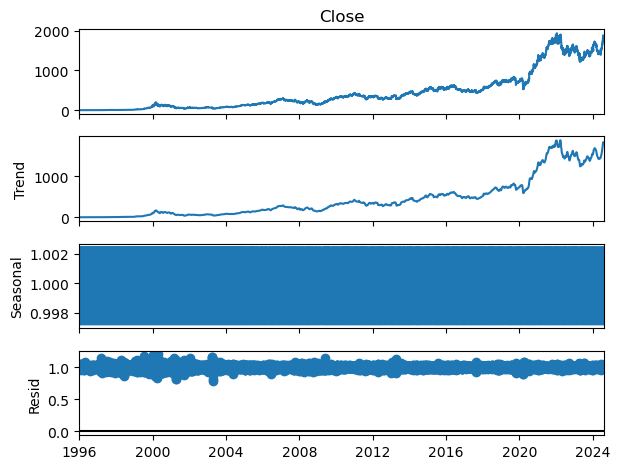

In [58]:
decomposition = sm.tsa.seasonal_decompose(df['Close'], model='multiplicative', period=12)  
fig=decomposition.plot()
plt.show()

### Checking for stationarity

#### 1.rolling statistics - moving average

In [59]:
df['rollmean']=df.Close.rolling(window=12).mean()
df['rollstd']=df.Close.rolling(window=12).std()


In [60]:
df

,Open,High,Low,Close,Adj Close,Volume,Daily Return,rollmean,rollstd
Date,,,,,,,,,
1996-01-01,0.794921,0.796679,0.791015,0.796679,0.516419,204800,NaN,NaN,NaN
1996-01-02,0.794921,0.798828,0.793457,0.793457,0.514330,204800,-0.004045,NaN,NaN
1996-01-03,0.798828,0.798828,0.798828,0.798828,0.517812,102400,0.006769,NaN,NaN
1996-01-04,0.791015,0.794921,0.791015,0.793554,0.514393,307200,-0.006602,NaN,NaN
1996-01-05,0.784179,0.784179,0.784179,0.784179,0.508316,51200,-0.011814,NaN,NaN
...,...,...,...,...,...,...,...,...,...
2024-08-08,1779.949951,1779.949951,1727.099976,1743.150024,1743.150024,6227910,-0.027070,1822.149994,51.341920
2024-08-09,1771.250000,1780.750000,1756.000000,1770.750000,1770.750000,4258524,0.015833,1816.883331,53.228314
2024-08-12,1773.050049,1803.500000,1768.099976,1797.400024,1797.400024,4315329,0.015050,1814.595835,53.444217


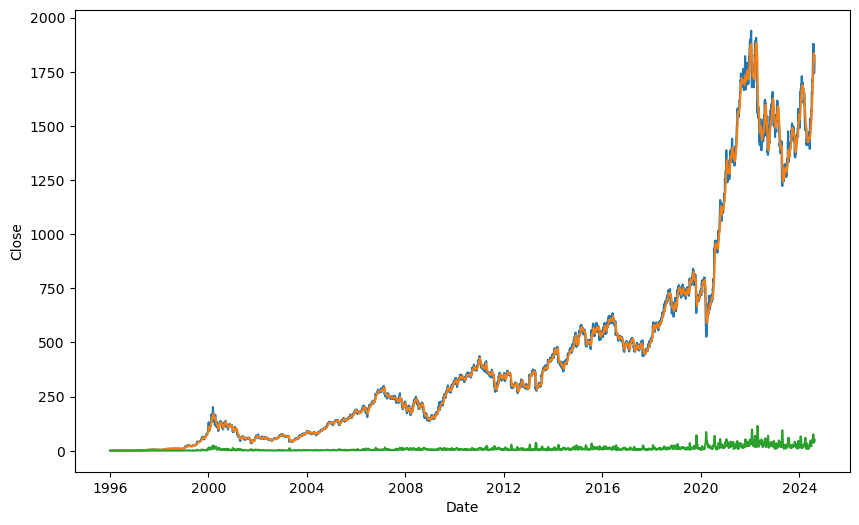

In [61]:
plt.figure(figsize=(10,6))
sns.lineplot(x=df.index,y=df.Close)
sns.lineplot(x=df.index,y=df.rollmean)
sns.lineplot(x=df.index,y=df.rollstd)
plt.show()

### 2.ADF (Augmented Dickey-Fuller )

In [62]:
adftest=adfuller(df.Close)
adftest

(1.2050978113214934,
 0.9960209156438541,
 35,
 7154,
 {'1%': -3.431264404239822,
  '5%': -2.8619440945791275,
  '10%': -2.5669850954217877},
 53809.84329983879)

In [63]:
stats=pd.Series(adftest[0:4],index=['test_statistics','p-value','no.lag used','No.observations used'])
stats

test_statistics            1.205098
p-value                    0.996021
no.lag used               35.000000
No.observations used    7154.000000
dtype: float64

In [64]:
for i,j in adftest[4].items():
    print('criticality',i,':',j)

criticality 1% : -3.431264404239822
criticality 5% : -2.8619440945791275
criticality 10% : -2.5669850954217877


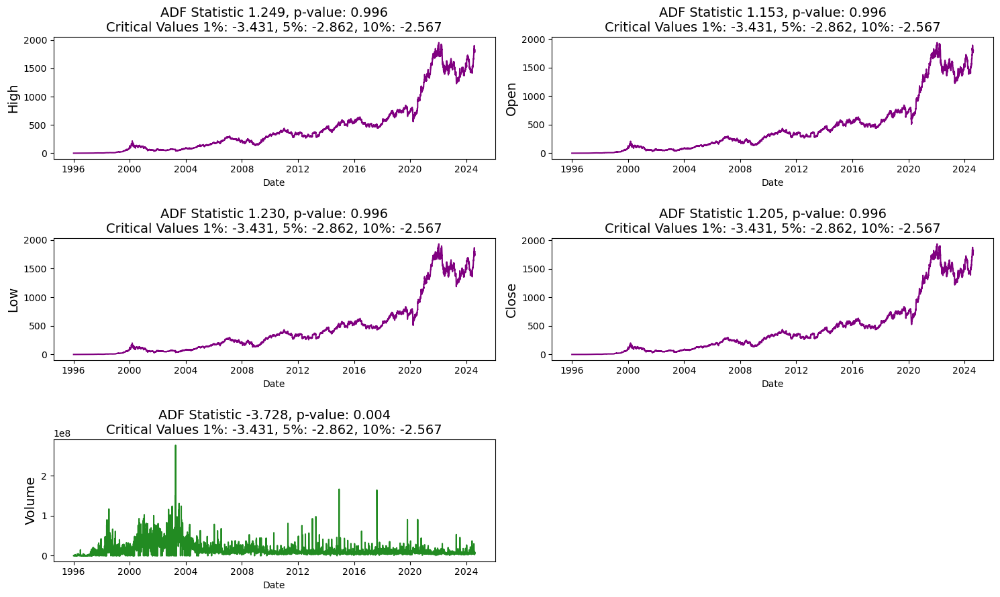

In [65]:
f, ax = plt.subplots(nrows=3, ncols=2, figsize=(15, 9))

def visualize_adfuller_results(series, title, ax):
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'orange'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'red'
    else:
        linecolor = 'purple'
    sns.lineplot(x=df_copy['Date'], y=series, ax=ax, color=linecolor)
    ax.set_title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    ax.set_ylabel(ylabel=title, fontsize=14)

visualize_adfuller_results(df_copy['High'].values, 'High', ax[0, 0])
visualize_adfuller_results(df_copy['Low'].values, 'Low', ax[1, 0])
visualize_adfuller_results(df_copy['Open'].values, 'Open', ax[0, 1])
visualize_adfuller_results(df_copy['Close'].values, 'Close', ax[1, 1])
visualize_adfuller_results(df_copy['Volume'].values, 'Volume', ax[2, 0])

f.delaxes(ax[2, 1])
plt.tight_layout()
plt.show()

#### p-value>0.05(level of significance). data is not stationary

In [66]:
def test_stationarity(df,var):
    df['rollMean'] = df[var].rolling(window = 12).mean()#var is passenger for this data, and eindow can be change as data required
    df['rollstd'] = df[var].rolling(window = 12).std()

    from statsmodels.tsa.stattools import adfuller
    adfTest  = adfuller(df[var])
    stats = pd.Series(adfTest[0:4],index = ['Test Statistic','p-value','No.lags used','number of observations used'])
    print(stats)

    for i,j in adfTest[4].items():
        print('criticality',i,':',j)

    sns.lineplot(data=df, x = df.index,y = df[var])
    sns.lineplot(data=df, x = df.index,y = df['rollMean'])
    sns.lineplot(data=df, x = df.index,y = df['rollstd'])

    if adfTest[1]<0.05:
        print('The data is Stationary')
    else:
        print('The data is non stationary')

Test Statistic                    1.205098
p-value                           0.996021
No.lags used                     35.000000
number of observations used    7154.000000
dtype: float64
criticality 1% : -3.431264404239822
criticality 5% : -2.8619440945791275
criticality 10% : -2.5669850954217877
The data is non stationary


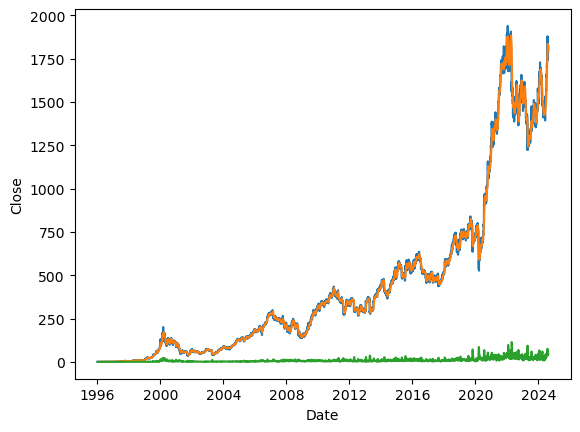

In [67]:
test_stationarity(df,'Close')

### Trying to make the data stationary

### 1.Timeshift

In [68]:
df.Close.diff()

Date
1996-01-01          NaN
1996-01-02    -0.003222
1996-01-03     0.005371
1996-01-04    -0.005274
1996-01-05    -0.009375
                ...    
2024-08-08   -48.500000
2024-08-09    27.599976
2024-08-12    26.650024
2024-08-13     0.049927
2024-08-14    25.800049
Name: Close, Length: 7190, dtype: float64

In [69]:
df.Close-df.Close.shift()

Date
1996-01-01          NaN
1996-01-02    -0.003222
1996-01-03     0.005371
1996-01-04    -0.005274
1996-01-05    -0.009375
                ...    
2024-08-08   -48.500000
2024-08-09    27.599976
2024-08-12    26.650024
2024-08-13     0.049927
2024-08-14    25.800049
Name: Close, Length: 7190, dtype: float64

In [70]:
df['shift']=df.Close.diff()

In [71]:
df

,Open,High,Low,Close,Adj Close,Volume,Daily Return,rollmean,rollstd,rollMean,shift
Date,,,,,,,,,,,
1996-01-01,0.794921,0.796679,0.791015,0.796679,0.516419,204800,NaN,NaN,NaN,NaN,NaN
1996-01-02,0.794921,0.798828,0.793457,0.793457,0.514330,204800,-0.004045,NaN,NaN,NaN,-0.003222
1996-01-03,0.798828,0.798828,0.798828,0.798828,0.517812,102400,0.006769,NaN,NaN,NaN,0.005371
1996-01-04,0.791015,0.794921,0.791015,0.793554,0.514393,307200,-0.006602,NaN,NaN,NaN,-0.005274
1996-01-05,0.784179,0.784179,0.784179,0.784179,0.508316,51200,-0.011814,NaN,NaN,NaN,-0.009375
...,...,...,...,...,...,...,...,...,...,...,...
2024-08-08,1779.949951,1779.949951,1727.099976,1743.150024,1743.150024,6227910,-0.027070,1822.149994,51.341920,1822.149994,-48.500000
2024-08-09,1771.250000,1780.750000,1756.000000,1770.750000,1770.750000,4258524,0.015833,1816.883331,53.228314,1816.883331,27.599976
2024-08-12,1773.050049,1803.500000,1768.099976,1797.400024,1797.400024,4315329,0.015050,1814.595835,53.444217,1814.595835,26.650024


Test Statistic                -1.513662e+01
p-value                        7.106977e-28
No.lags used                   3.400000e+01
number of observations used    7.144000e+03
dtype: float64
criticality 1% : -3.431265684661316
criticality 5% : -2.861944660337305
criticality 10% : -2.5669853965841387
The data is Stationary


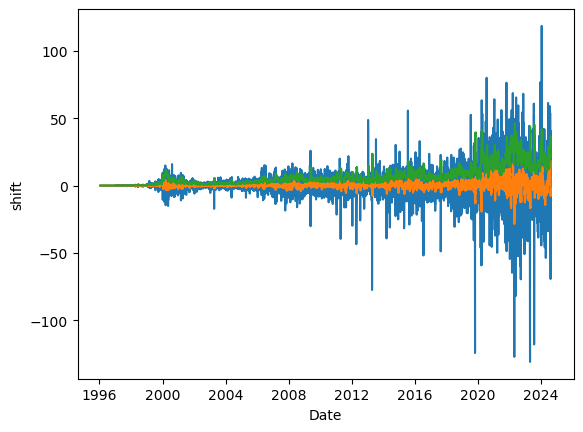

In [72]:
test_stationarity(df.dropna(),'shift')

p-value<0.05(level of significance) and Test statistics is also less than 5%criticality. So,data is  stationary

## Autocorrelation Analysis

### pacf

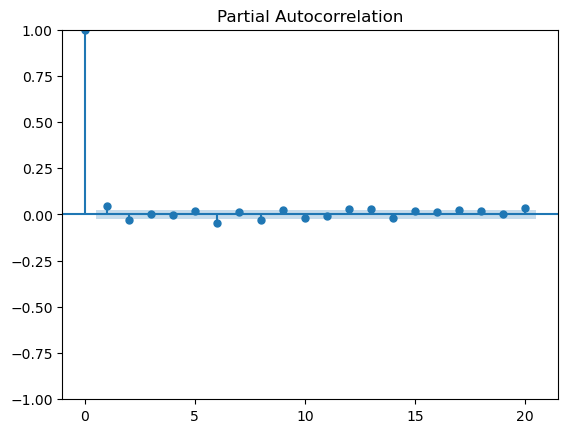

In [73]:
plot_pacf(df['shift'].dropna(),lags = 20);

p=11

d=2

q=9

### First Order Differencing


In [74]:
# First Order Differencing
ts_diff = np.diff(df['Close'])
df['Close_1'] = np.append([0], ts_diff)



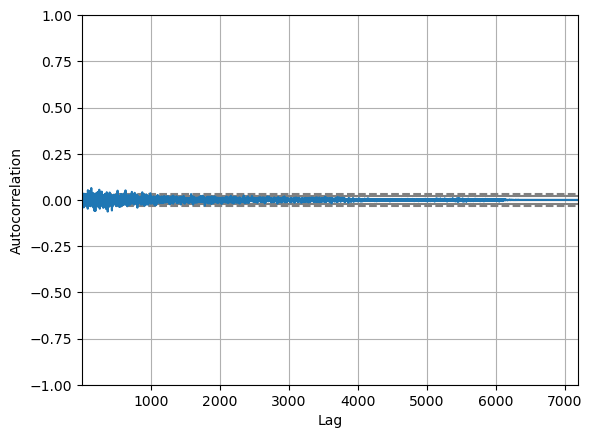

In [75]:
from pandas.plotting import autocorrelation_plot

autocorrelation_plot(df['Close_1'])
plt.show()

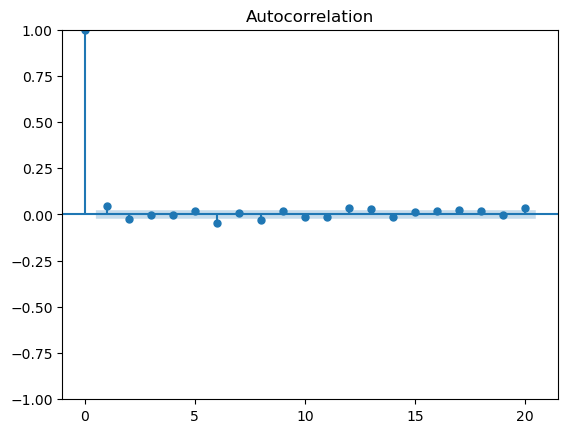

In [76]:
plot_acf(df['shift'].dropna(),lags = 20);

# Model Building

### Train Test Split

In [77]:
from sklearn.model_selection import TimeSeriesSplit

N_SPLITS = 5

X = df_copy['Date']
y = df_copy['Close']

folds = TimeSeriesSplit(n_splits=N_SPLITS)

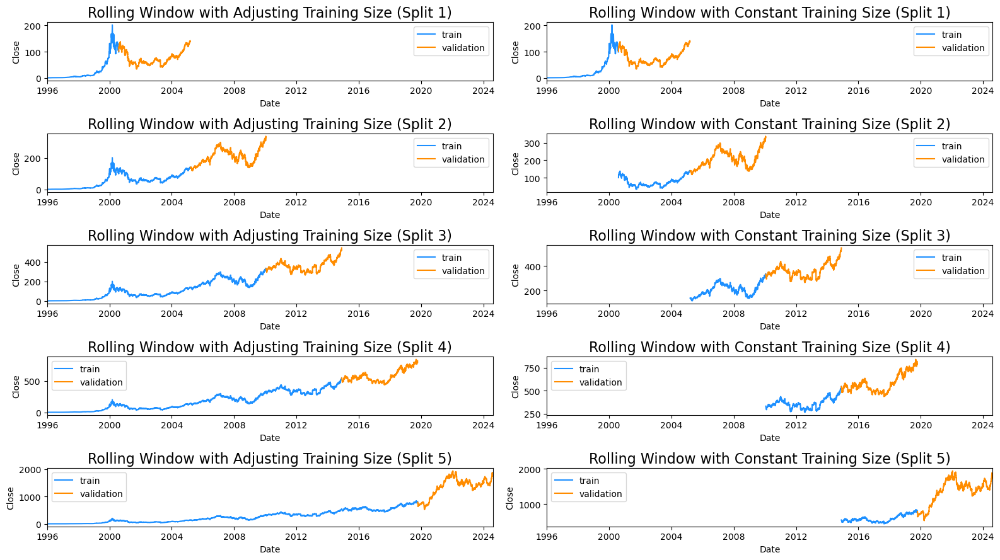

In [78]:
f, ax = plt.subplots(nrows=N_SPLITS, ncols=2, figsize=(16, 9))

for i, (train_index, valid_index) in enumerate(folds.split(X)):
    X_train, X_valid = X[train_index], X[valid_index]
    y_train, y_valid = y[train_index], y[valid_index]

    sns.lineplot(
        x=X_train, 
        y=y_train, 
        ax=ax[i,0], 
        color='dodgerblue', 
        label='train'
    )
    sns.lineplot(
        x=X_train[len(X_train) - len(X_valid):(len(X_train) - len(X_valid) + len(X_valid))], 
        y=y_train[len(X_train) - len(X_valid):(len(X_train) - len(X_valid) + len(X_valid))], 
        ax=ax[i,1], 
        color='dodgerblue', 
        label='train'
    )

    for j in range(2):
        sns.lineplot(x= X_valid, y= y_valid, ax=ax[i, j], color='darkorange', label='validation')
    ax[i, 0].set_title(f"Rolling Window with Adjusting Training Size (Split {i+1})", fontsize=16)
    ax[i, 1].set_title(f"Rolling Window with Constant Training Size (Split {i+1})", fontsize=16)

for i in range(N_SPLITS):
    ax[i, 0].set_xlim([start_date,end_date])
    ax[i, 1].set_xlim([start_date,end_date])
    
plt.tight_layout()
plt.show()

In [79]:
df.head()

,Open,High,Low,Close,Adj Close,Volume,Daily Return,rollmean,rollstd,rollMean,shift,Close_1
Date,,,,,,,,,,,,
1996-01-01,0.794921,0.796679,0.791015,0.796679,0.516419,204800,NaN,NaN,NaN,NaN,NaN,0.000000
1996-01-02,0.794921,0.798828,0.793457,0.793457,0.514330,204800,-0.004045,NaN,NaN,NaN,-0.003222,-0.003222
1996-01-03,0.798828,0.798828,0.798828,0.798828,0.517812,102400,0.006769,NaN,NaN,NaN,0.005371,0.005371
1996-01-04,0.791015,0.794921,0.791015,0.793554,0.514393,307200,-0.006602,NaN,NaN,NaN,-0.005274,-0.005274
1996-01-05,0.784179,0.784179,0.784179,0.784179,0.508316,51200,-0.011814,NaN,NaN,NaN,-0.009375,-0.009375


In [80]:
train = df[:round(len(df)*.75)]#1st 75% of data
test = df[round(len(df)*.75):]# after 75% remaing 25%
train.head()

,Open,High,Low,Close,Adj Close,Volume,Daily Return,rollmean,rollstd,rollMean,shift,Close_1
Date,,,,,,,,,,,,
1996-01-01,0.794921,0.796679,0.791015,0.796679,0.516419,204800,NaN,NaN,NaN,NaN,NaN,0.000000
1996-01-02,0.794921,0.798828,0.793457,0.793457,0.514330,204800,-0.004045,NaN,NaN,NaN,-0.003222,-0.003222
1996-01-03,0.798828,0.798828,0.798828,0.798828,0.517812,102400,0.006769,NaN,NaN,NaN,0.005371,0.005371
1996-01-04,0.791015,0.794921,0.791015,0.793554,0.514393,307200,-0.006602,NaN,NaN,NaN,-0.005274,-0.005274
1996-01-05,0.784179,0.784179,0.784179,0.784179,0.508316,51200,-0.011814,NaN,NaN,NaN,-0.009375,-0.009375


In [81]:
test

,Open,High,Low,Close,Adj Close,Volume,Daily Return,rollmean,rollstd,rollMean,shift,Close_1
Date,,,,,,,,,,,,
2017-05-05,468.000000,468.674988,460.000000,465.750000,386.207825,4432788,-0.006559,462.941666,3.368745,462.941666,-3.075012,-3.075012
2017-05-08,469.000000,474.274994,466.000000,472.750000,392.012299,4707098,0.015029,464.037498,4.215334,464.037498,7.000000,7.000000
2017-05-09,475.299988,475.975006,471.049988,473.325012,392.489166,5649372,0.001216,464.843750,4.988775,464.843750,0.575012,0.575012
2017-05-10,473.575012,475.000000,468.575012,471.825012,391.245331,3364302,-0.003169,465.675001,5.267831,465.675001,-1.500000,-1.500000
2017-05-11,473.424988,474.924988,468.774994,472.049988,391.431824,3229482,0.000477,466.406250,5.507963,466.406250,0.224976,0.224976
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-08-08,1779.949951,1779.949951,1727.099976,1743.150024,1743.150024,6227910,-0.027070,1822.149994,51.341920,1822.149994,-48.500000,-48.500000
2024-08-09,1771.250000,1780.750000,1756.000000,1770.750000,1770.750000,4258524,0.015833,1816.883331,53.228314,1816.883331,27.599976,27.599976
2024-08-12,1773.050049,1803.500000,1768.099976,1797.400024,1797.400024,4315329,0.015050,1814.595835,53.444217,1814.595835,26.650024,26.650024


In [82]:
train.shape

(5392, 12)

In [83]:
test.shape

(1798, 12)

In [84]:
test.index = pd.to_datetime(test.index)
test.dtypes

Open            float64
High            float64
Low             float64
Close           float64
Adj Close       float64
Volume            int64
Daily Return    float64
rollmean        float64
rollstd         float64
rollMean        float64
shift           float64
Close_1         float64
dtype: object

# ARIMA Model

In [85]:
# Ensure your DataFrame's index is in datetime format
df.index = pd.to_datetime(df.index)

# Define start and end dates as pd.Timestamp objects
start_date = pd.Timestamp('2017-05-05')
end_date = pd.Timestamp('2024-08-14')

# Fit the ARIMA model
model = ARIMA(df['Close'], order=(11,2,9))
model = model.fit()

# Predict using the defined start and end dates
prediction = model.predict(start=start_date, end=end_date)

print(prediction)

Date
2017-05-05     469.298159
2017-05-08     465.468638
2017-05-09     473.851949
2017-05-10     472.144983
2017-05-11     472.210868
                 ...     
2024-08-08    1795.214459
2024-08-09    1736.948456
2024-08-12    1773.580822
2024-08-13    1801.675911
2024-08-14    1795.342362
Name: predicted_mean, Length: 1798, dtype: float64


In [86]:
test['prediction']=prediction
test

,Open,High,Low,Close,Adj Close,Volume,Daily Return,rollmean,rollstd,rollMean,shift,Close_1,prediction
Date,,,,,,,,,,,,,
2017-05-05,468.000000,468.674988,460.000000,465.750000,386.207825,4432788,-0.006559,462.941666,3.368745,462.941666,-3.075012,-3.075012,469.298159
2017-05-08,469.000000,474.274994,466.000000,472.750000,392.012299,4707098,0.015029,464.037498,4.215334,464.037498,7.000000,7.000000,465.468638
2017-05-09,475.299988,475.975006,471.049988,473.325012,392.489166,5649372,0.001216,464.843750,4.988775,464.843750,0.575012,0.575012,473.851949
2017-05-10,473.575012,475.000000,468.575012,471.825012,391.245331,3364302,-0.003169,465.675001,5.267831,465.675001,-1.500000,-1.500000,472.144983
2017-05-11,473.424988,474.924988,468.774994,472.049988,391.431824,3229482,0.000477,466.406250,5.507963,466.406250,0.224976,0.224976,472.210868
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-08-08,1779.949951,1779.949951,1727.099976,1743.150024,1743.150024,6227910,-0.027070,1822.149994,51.341920,1822.149994,-48.500000,-48.500000,1795.214459
2024-08-09,1771.250000,1780.750000,1756.000000,1770.750000,1770.750000,4258524,0.015833,1816.883331,53.228314,1816.883331,27.599976,27.599976,1736.948456
2024-08-12,1773.050049,1803.500000,1768.099976,1797.400024,1797.400024,4315329,0.015050,1814.595835,53.444217,1814.595835,26.650024,26.650024,1773.580822


In [87]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  Close   No. Observations:                 7190
Model:                ARIMA(11, 2, 9)   Log Likelihood              -27024.135
Date:                Fri, 23 Aug 2024   AIC                          54090.270
Time:                        07:36:10   BIC                          54234.753
Sample:                             0   HQIC                         54139.990
                               - 7190                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.2886      0.694     -1.858      0.063      -2.648       0.071
ar.L2         -1.8468      0.581     -3.178      0.001      -2.986      -0.708
ar.L3         -1.8943      1.024     -1.851      0.064      -3.901       0.112
ar.L4         -1.8742      1.003     -1.868      0.062      -3.840       0.092
ar.L5         -1.5096      1.033     -1.461      0.144      -3.535       0.516
ar.L6         -1.2928      0.833     -1.552      0.121      -2.925       0.340
ar.L7         -0.8676      0.688     -1.261      0.207      -2.216       0.481
ar.L8         -0.2789      0.347     -0.805      0.421      -0.958       0.400
ar.L9          0.0159      0.029      0.538      0.590      -0.042       0.074
ar.L10         0.0031      0.014      0.217      0.828      -0.025       0.031
ar.L11         0.0092      0.014      0.681      0.496      -0.017       0.036
ma.L1          0.3381      0.693      0.488      0.626      -1.021       1.697
ma.L2          0.5451      0.297      1.838      0.066      -0.036       1.126
ma.L3          0.0657      0.477      0.138      0.890      -0.869       1.001
ma.L4         -0.0371      0.207     -0.179      0.858      -0.444       0.370
ma.L5         -0.3439      0.215     -1.597      0.110      -0.766       0.078
ma.L6         -0.2600      0.255     -1.021      0.307      -0.759       0.239
ma.L7         -0.3913      0.242     -1.619      0.105      -0.865       0.082
ma.L8         -0.6339      0.326     -1.945      0.052      -1.272       0.005
ma.L9         -0.2792      0.375     -0.745      0.456      -1.013       0.455
sigma2       106.7299      0.547    195.224      0.000     105.658     107.801
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):            161958.32
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):              51.47   Skew:                            -0.63
Prob(H) (two-sided):                  0.00   Kurtosis:                        26.22
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Axes: xlabel='Date', ylabel='Close'>

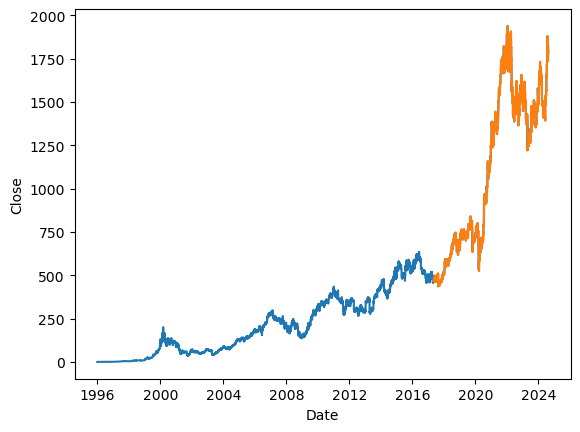

In [88]:
sns.figsize=(12,5)
sns.lineplot(data  = df,x = df.index, y = df.Close)
sns.lineplot(data = test, x = test.index,y = test.prediction)

In [90]:
from sklearn.metrics import r2_score
arima_mse = mean_squared_error(test['Close'], test['prediction'])
arima_mae= mean_absolute_error(test['Close'], test['prediction'])
# Calculate RMSE
arima_rmse = np.sqrt(arima_mse)

# Calculate R2_Score
r2_score = r2_score(test['Close'], test['prediction'])

print(f"Arima_MAE: {arima_mse}")
print(f"Arima_MSE: {arima_mse}")
print(f"Arima_RMSE: {arima_rmse}")
print(f'Arima_r2_score: {r2_score}')

Arima_MAE: 358.06775646560766
Arima_MSE: 358.06775646560766
Arima_RMSE: 18.922678363952805
Arima_r2_score: 0.9982069485055751


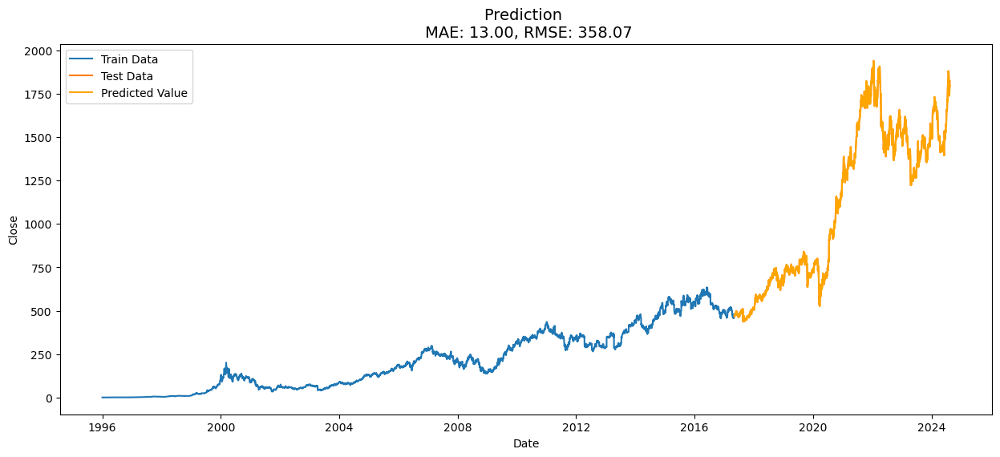

In [91]:
f, ax = plt.subplots(figsize=(15, 6))

# Plot the actual values
sns.lineplot(x=train.index, y=train['Close'], ax=ax, label='Train Data')
sns.lineplot(x=test.index, y=test['Close'], ax=ax, label='Test Data')

# Plot the predictions
sns.lineplot(x=test.index, y=prediction, ax=ax, color='orange', label='Predicted Value')

ax.set_title(f'Prediction \n MAE: {arima_mae:.2f}, RMSE: {arima_mse:.2f}', fontsize=14)
plt.show()


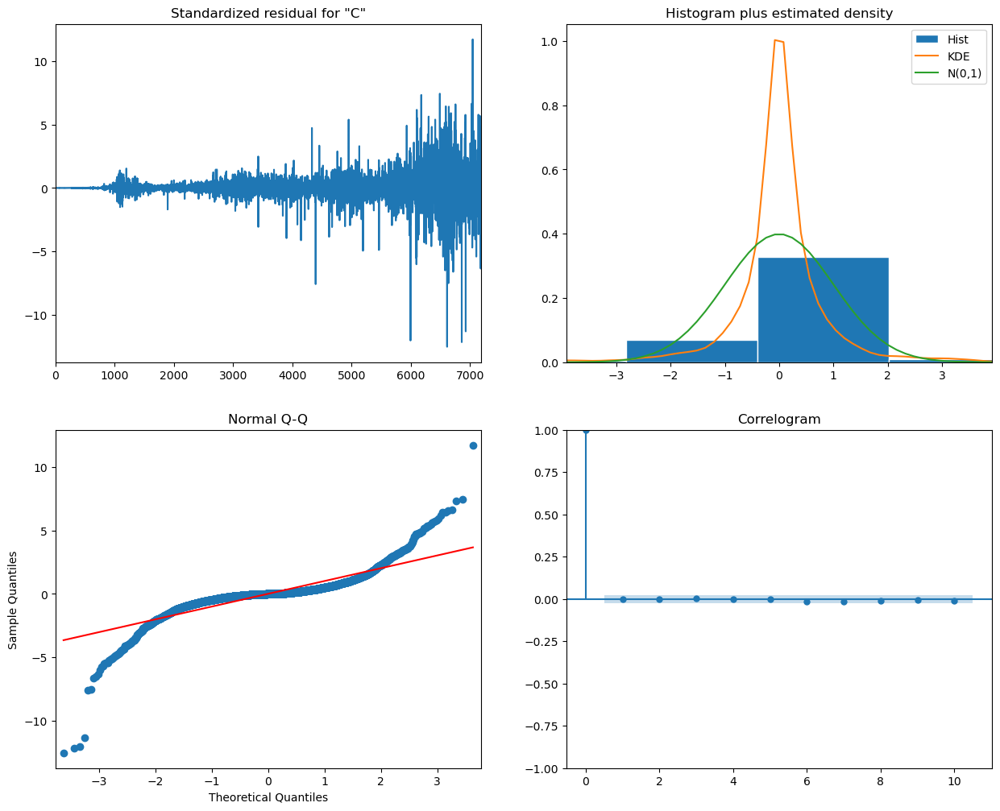

In [92]:
model.plot_diagnostics(figsize = (15,12))
plt.show()

### Auto_arima model

In [93]:
import pmdarima as pm
# Assuming df is your DataFrame and 'Close' is the column you want to model
auto_arima_model = pm.auto_arima(train['Close'], 
                      start_p=1, start_q=1,
                      max_p=11, max_q=9,  # limits for p and q
                      seasonal=False,      # No seasonality
                      d=2,                 # You already know the order of differencing
                      trace=True,          # Print the output of model fitting
                      error_action='ignore',  
                      suppress_warnings=True)



prediction = auto_arima_model.predict(n_periods=1798)

print(prediction)


Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=2.64 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=36083.328, Time=0.09 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=34792.104, Time=0.18 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.69 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=36081.328, Time=0.08 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=34104.222, Time=0.30 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=33703.993, Time=0.53 sec
 ARIMA(4,2,0)(0,0,0)[0] intercept   : AIC=33495.156, Time=0.71 sec
 ARIMA(5,2,0)(0,0,0)[0] intercept   : AIC=33340.931, Time=1.08 sec
 ARIMA(6,2,0)(0,0,0)[0] intercept   : AIC=33259.265, Time=1.23 sec
 ARIMA(7,2,0)(0,0,0)[0] intercept   : AIC=33174.491, Time=1.52 sec
 ARIMA(8,2,0)(0,0,0)[0] intercept   : AIC=33104.578, Time=1.79 sec
 ARIMA(9,2,0)(0,0,0)[0] intercept   : AIC=33044.275, Time=2.47 sec
 ARIMA(10,2,0)(0,0,0)[0] intercept   : AIC=33002.539, Time=2.61 sec
 ARIMA(11,2,0)(0,0,0)[0] inter

In [94]:
auto_arima_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 5392
Model:              SARIMAX(11, 2, 0)   Log Likelihood              -16454.904
Date:                Fri, 23 Aug 2024   AIC                          32933.809
Time:                        07:37:59   BIC                          33012.916
Sample:                             0   HQIC                         32961.429
                               - 5392                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8839      0.008   -105.447      0.000      -0.900      -0.868
ar.L2         -0.8469      0.012    -69.117      0.000      -0.871      -0.823
ar.L3         -0.7617      0.015    -51.150      0.000      -0.791      -0.733
ar.L4         -0.6615      0.016    -41.051      0.000      -0.693      -0.630
ar.L5         -0.5833      0.017    -34.554      0.000      -0.616      -0.550
ar.L6         -0.4995      0.017    -29.977      0.000      -0.532      -0.467
ar.L7         -0.4396      0.017    -26.445      0.000      -0.472      -0.407
ar.L8         -0.3611      0.017    -21.519      0.000      -0.394      -0.328
ar.L9         -0.2777      0.015    -18.220      0.000      -0.308      -0.248
ar.L10        -0.1881      0.013    -14.063      0.000      -0.214      -0.162
ar.L11        -0.1125      0.010    -11.110      0.000      -0.132      -0.093
sigma2        26.2472      0.169    155.035      0.000      25.915      26.579
===================================================================================
Ljung-Box (L1) (Q):                   0.46   Jarque-Bera (JB):            109318.02
Prob(Q):                              0.50   Prob(JB):                         0.00
Heteroskedasticity (H):               7.95   Skew:                            -0.80
Prob(H) (two-sided):                  0.00   Kurtosis:                        25.00
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [95]:
prediction

5392     469.024130
5393     469.732971
5394     470.730983
5395     471.312084
5396     472.028745
           ...     
7185    2250.143216
7186    2251.137166
7187    2252.131116
7188    2253.125066
7189    2254.119016
Length: 1798, dtype: float64

In [96]:
# Assuming predictions is a numpy array
import pandas as pd

# Ensure predictions is a numpy array
import numpy as np
predictions = np.array(prediction)

# Create a DataFrame from predictions
predictions_AA_df = pd.DataFrame(predictions, index=test.index, columns=['Predicted_AA'])

print(predictions_AA_df.head())


            Predicted_AA
Date                    
2017-05-05    469.024130
2017-05-08    469.732971
2017-05-09    470.730983
2017-05-10    471.312084
2017-05-11    472.028745


In [97]:
# Reset index if needed
df_test_reset = test.reset_index()
predictions_df_reset = predictions_AA_df.reset_index()

# Merge on the index column
combined_df = pd.merge(df_test_reset, predictions_df_reset, on='Date', how='left')

# Set index back if necessary
combined_df = combined_df.set_index('Date')

print(combined_df.head())


                  Open        High         Low       Close   Adj Close  \
Date                                                                     
2017-05-05  468.000000  468.674988  460.000000  465.750000  386.207825   
2017-05-08  469.000000  474.274994  466.000000  472.750000  392.012299   
2017-05-09  475.299988  475.975006  471.049988  473.325012  392.489166   
2017-05-10  473.575012  475.000000  468.575012  471.825012  391.245331   
2017-05-11  473.424988  474.924988  468.774994  472.049988  391.431824   

             Volume  Daily Return    rollmean   rollstd    rollMean     shift  \
Date                                                                            
2017-05-05  4432788     -0.006559  462.941666  3.368745  462.941666 -3.075012   
2017-05-08  4707098      0.015029  464.037498  4.215334  464.037498  7.000000   
2017-05-09  5649372      0.001216  464.843750  4.988775  464.843750  0.575012   
2017-05-10  3364302     -0.003169  465.675001  5.267831  465.675001 -1.50000

In [99]:
combined_df.head()

,Open,High,Low,Close,Adj Close,Volume,Daily Return,rollmean,rollstd,rollMean,shift,Close_1,prediction,Predicted_AA
Date,,,,,,,,,,,,,,
2017-05-05,468.000000,468.674988,460.000000,465.750000,386.207825,4432788,-0.006559,462.941666,3.368745,462.941666,-3.075012,-3.075012,469.298159,469.024130
2017-05-08,469.000000,474.274994,466.000000,472.750000,392.012299,4707098,0.015029,464.037498,4.215334,464.037498,7.000000,7.000000,465.468638,469.732971
2017-05-09,475.299988,475.975006,471.049988,473.325012,392.489166,5649372,0.001216,464.843750,4.988775,464.843750,0.575012,0.575012,473.851949,470.730983
2017-05-10,473.575012,475.000000,468.575012,471.825012,391.245331,3364302,-0.003169,465.675001,5.267831,465.675001,-1.500000,-1.500000,472.144983,471.312084
2017-05-11,473.424988,474.924988,468.774994,472.049988,391.431824,3229482,0.000477,466.406250,5.507963,466.406250,0.224976,0.224976,472.210868,472.028745


In [100]:
residuals = auto_arima_model.resid()
print(residuals.describe())

count    5392.000000
mean        0.001295
std         5.122669
min       -78.082515
25%        -1.730011
50%        -0.004320
75%         1.688784
max        55.289070
dtype: float64


<Axes: xlabel='Date', ylabel='Close'>

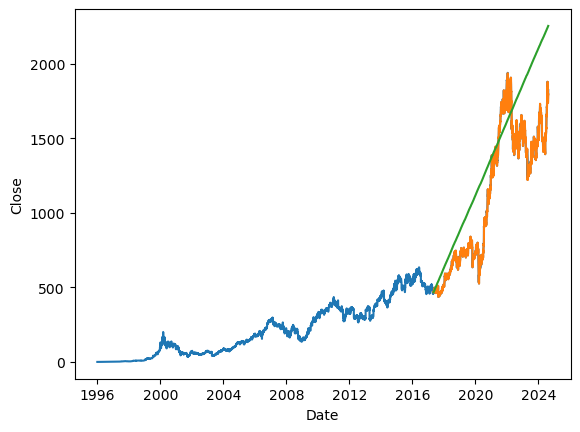

In [106]:
sns.lineplot(data  = df,x = df.index, y = df.Close)
sns.lineplot(data = combined_df, x = combined_df.index,y = combined_df.prediction)
sns.lineplot(data = combined_df, x = combined_df.index,y = combined_df.Predicted_AA)

In [107]:
from sklearn.metrics import r2_score
auto_arima_mse = mean_squared_error(test['Close'], combined_df['Predicted_AA'])
auto_arima_mae= mean_absolute_error(test['Close'], combined_df['Predicted_AA'])
# Calculate RMSE
auto_arima_rmse = np.sqrt(auto_arima_mse)

# Calculate R2_Score
auto_r2_score = r2_score(test['Close'], combined_df['Predicted_AA'])

print(f"auto_Arima_MAE: {auto_arima_mse}")
print(f"auto_Arima_MSE: {auto_arima_mse}")
print(f"auto_Arima_RMSE: {auto_arima_rmse}")
print(f'auto_Arima_r2_score: {auto_r2_score}')

auto_Arima_MAE: 121509.78774808127
auto_Arima_MSE: 121509.78774808127
auto_Arima_RMSE: 348.5825407964106
auto_Arima_r2_score: 0.39153050623849217


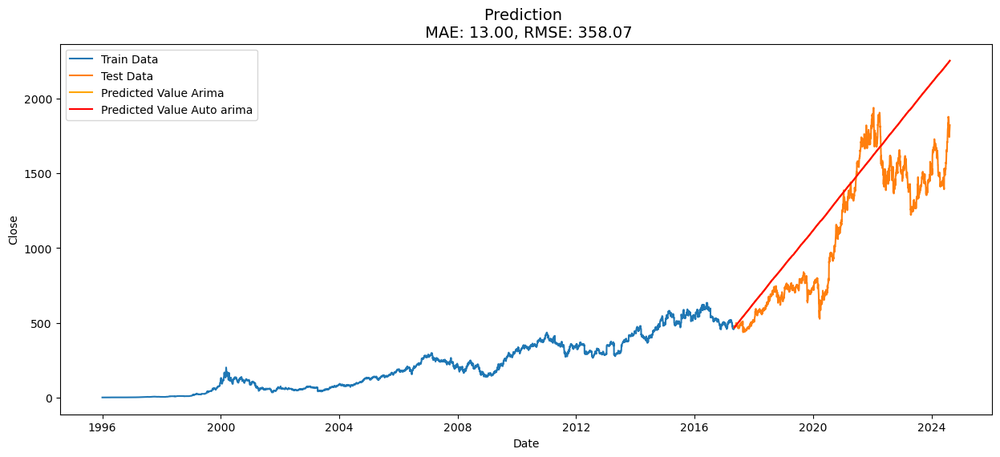

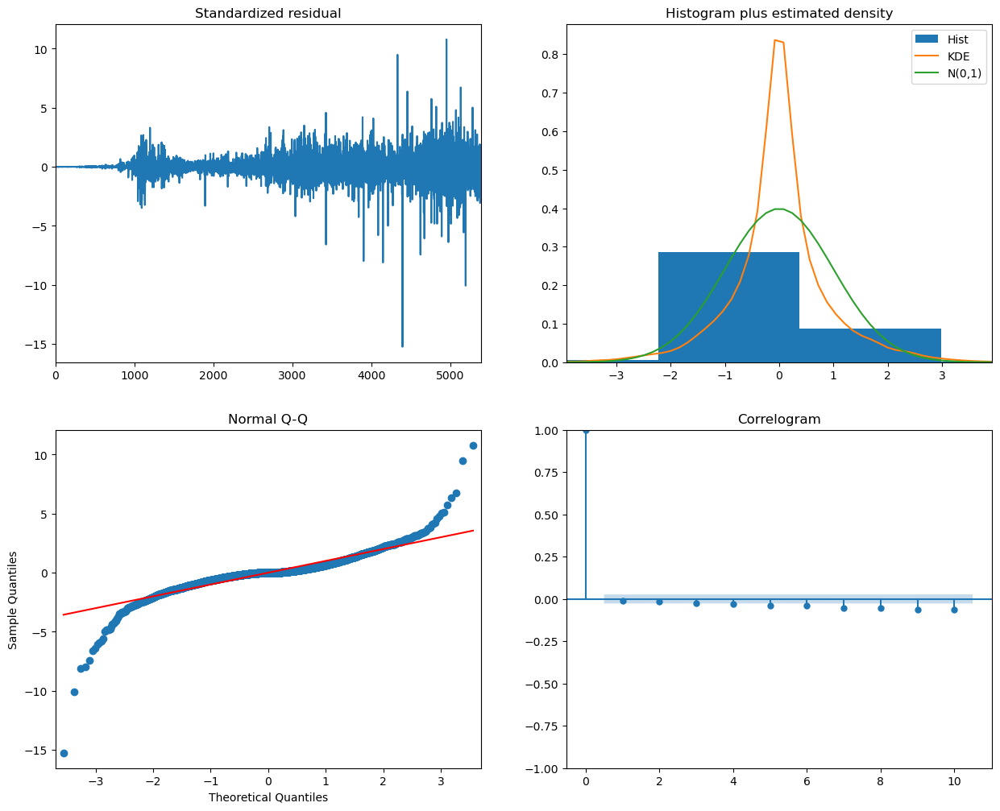

In [105]:
f, ax = plt.subplots(figsize=(15, 6))

# Plot the actual values
sns.lineplot(x=train.index, y=train['Close'], ax=ax, label='Train Data')
sns.lineplot(x=test.index, y=test['Close'], ax=ax, label='Test Data')

# Plot the predictions
sns.lineplot(x=test.index, y=prediction, ax=ax, color='orange', label='Predicted Value Arima')
sns.lineplot(x=combined_df.index, y=combined_df.Predicted_AA, ax=ax, color='red', label='Predicted Value Auto arima')

ax.set_title(f'Prediction \n MAE: {arima_mae:.2f}, RMSE: {arima_mse:.2f}', fontsize=14)
plt.show()


auto_arima_model.plot_diagnostics(figsize = (15,12))
plt.show()

# XG-Boost Model

In [421]:
# Lets First Take all the Close Price 
closedf = df_copy[['Date','Close']]
print("Shape of close dataframe:", closedf.shape)

Shape of close dataframe: (7190, 2)


In [422]:
fig = px.line(closedf, x=closedf.Date, y=closedf.Close,labels={'date':'Date','close':'Close Stock'})
fig.update_traces(marker_line_width=2, opacity=0.8, marker_line_color='orange')
fig.update_layout(title_text='Whole period of timeframe of Infosys close price 2014-2024', plot_bgcolor='white', 
                  font_size=15, font_color='black')
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Now we will Take data of just 1 Year¶


In [423]:
closedf = closedf[closedf['Date'] > '2023-08-14']
close_stock = closedf.copy()
print("Total data for prediction: ",closedf.shape[0])

Total data for prediction:  244


In [424]:
closedf

,Date,Close
6946,2023-08-16,1418.500000
6947,2023-08-17,1411.550049
6948,2023-08-18,1388.800049
6949,2023-08-21,1405.400024
6950,2023-08-22,1403.750000
...,...,...
7185,2024-08-08,1743.150024
7186,2024-08-09,1770.750000
7187,2024-08-12,1797.400024
7188,2024-08-13,1797.449951


In [425]:
fig = px.line(closedf, x=closedf.Date, y=closedf.Close,labels={'date':'Date','close':'Close Stock'})
fig.update_traces(marker_line_width=2, opacity=0.8, marker_line_color='orange')
fig.update_layout(title_text='Considered period to predict Infosys close price', 
                  plot_bgcolor='white', font_size=15, font_color='black')
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Feature Scaling the data

In [426]:
 #deleting date column and normalizing using MinMax Scaler

del closedf['Date']
scaler=MinMaxScaler(feature_range=(0,1))
closedf=scaler.fit_transform(np.array(closedf).reshape(-1,1))
print(closedf.shape)

(244, 1)


### Train Test Splitting

In [429]:
training_size=int(len(closedf)*0.60)
test_size=len(closedf)-training_size
train_data,test_data=closedf[0:training_size,:],closedf[training_size:len(closedf),:1]
print("train_data: ", train_data.shape)
print("test_data: ", test_data.shape)

train_data:  (146, 1)
test_data:  (98, 1)


In [432]:
print("train:",train_data.shape,"test:",test_data.shape)

train: (146, 1) test: (98, 1)


### Preparing data into time series analysis

In [433]:
# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]   ###i=0, 0,1,2,3-----99   100 
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return np.array(dataX), np.array(dataY)

In [434]:
time_step = 15
X_train_XGB, y_train_XGB = create_dataset(train_data, time_step)
X_test_XGB, y_test_XGB = create_dataset(test_data, time_step)

print("X_train: ", X_train_XGB.shape)
print("y_train: ", y_train_XGB.shape)
print("X_test: ", X_test_XGB.shape)
print("y_test", y_test_XGB.shape)

X_train:  (130, 15)
y_train:  (130,)
X_test:  (82, 15)
y_test (82,)


#### Importing XGBRegressor module and Fit X_train and y_train for training model¶


In [435]:
import numpy as np

# Check for NaN values
print(np.isnan(y_train_XGB).sum())

# Check for infinite values
print(np.isinf(y_train_XGB).sum())

# Remove rows with NaN or infinity
mask = ~np.isnan(y_train_XGB) & ~np.isinf(y_train_XGB)
X_train_XGB = X_train_XGB[mask]
y_train_XGB = y_train_XGB[mask]


0
0


In [436]:
# Convert to float32 if necessary
y_train_XGB = y_train_XGB.astype(np.float32)


In [437]:
from xgboost import XGBRegressor
XGB_model = XGBRegressor(n_estimators=1000)
XGB_model.fit(X_train_XGB, y_train_XGB, verbose=False)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [438]:
predictions_XGB = XGB_model.predict(X_test_XGB)
predictions_XGB

array([0.2694602 , 0.22144386, 0.17897464, 0.12463069, 0.12449025,
       0.13337097, 0.1570454 , 0.12440091, 0.13636722, 0.09805197,
       0.13484631, 0.10036489, 0.10897557, 0.11076573, 0.11398375,
       0.14767914, 0.11949194, 0.14798857, 0.1195173 , 0.10960332,
       0.10767752, 0.11551562, 0.18422557, 0.17171419, 0.15993227,
       0.18829824, 0.1944244 , 0.17681804, 0.21497627, 0.24132803,
       0.19231041, 0.1415894 , 0.06387755, 0.05542266, 0.04642818,
       0.10979581, 0.22956571, 0.2788635 , 0.26454437, 0.33909994,
       0.20811866, 0.23362544, 0.22423378, 0.27435398, 0.30106232,
       0.27062404, 0.27628833, 0.27274132, 0.3409227 , 0.30474415,
       0.39869094, 0.5063648 , 0.50206953, 0.5282409 , 0.5214836 ,
       0.57083005, 0.5708093 , 0.5678414 , 0.58585113, 0.59324324,
       0.56563926, 0.65339077, 0.6841653 , 0.672335  , 0.663049  ,
       0.6407619 , 0.6372153 , 0.60402113, 0.6212306 , 0.6162808 ,
       0.61057633, 0.61944366, 0.6206137 , 0.6189534 , 0.61206

In [439]:
print(f"Length of y_test_XGB: {len(y_test_XGB)}")
print(f"Length of predictions: {len(predictions_XGB)}")


Length of y_test_XGB: 82
Length of predictions: 82


In [440]:

XGB_mse = mean_squared_error(y_test_XGB, predictions_XGB)
XGB_mae= mean_absolute_error(y_test_XGB, predictions_XGB)
# Calculate RMSE
XGB_rmse = np.sqrt(XGB_mse)

# Calculate R2_Score
XGB_r2_score = r2_score(y_test_XGB, predictions_XGB)

print("Mean Absolute Error - MAE_XGB :", XGB_mae)
print("Mean Squared Error - MSE_XGB : " ,XGB_mae)
print("Root Mean squared Error - RMSE_XGB : " ,XGB_rmse)
print(f'XGB_r2_score: {XGB_r2_score}')

Mean Absolute Error - MAE_XGB : 0.08692593100241691
Mean Squared Error - MSE_XGB :  0.08692593100241691
Root Mean squared Error - RMSE_XGB :  0.13491684406879925
XGB_r2_score: 0.792659673891446


In [441]:
train_predict_XGB=XGB_model.predict(X_train_XGB)
test_predict_XGB=XGB_model.predict(X_test_XGB)

train_predict_XGB = train_predict_XGB.reshape(-1,1)
test_predict_XGB = test_predict_XGB.reshape(-1,1)

print("Train data prediction:", train_predict_XGB.shape)
print("Test data prediction:", test_predict_XGB.shape)

Train data prediction: (130, 1)
Test data prediction: (82, 1)


In [442]:
# Transform back to original form

train_predict_XGB = scaler.inverse_transform(train_predict_XGB)
test_predict_XGB = scaler.inverse_transform(test_predict_XGB)
original_ytrain_XGB = scaler.inverse_transform(y_train_XGB.reshape(-1,1)) 
original_ytest_XGB = scaler.inverse_transform(y_test_XGB.reshape(-1,1)) 

In [444]:
import numpy as np
import pandas as pd
import plotly.express as px
from itertools import cycle

# Define the look_back period (should be the same as used in model)
look_back_XGB = 15

# Flatten predictions if they are 2D
train_predict__XGB = np.array(train_predict_XGB).flatten()
test_predict__XGB= np.array(test_predict_XGB).flatten()

# Ensure the lengths match for train and test predictions
train_len = len(train_predict__XGB)
test_len = len(test_predict__XGB)

# Create empty arrays for the predictions with NaNs
trainPredictPlot__XGB = np.full((len(closedf),), np.nan)
testPredictPlot__XGB = np.full((len(closedf),), np.nan)

# Adjust indices to fit within the bounds of closedf
start_train = 0
end_train = start_train + train_len
if end_train <= len(closedf):
    trainPredictPlot__XGB[start_train:end_train] = train_predict__XGB
else:
    print(f"Error: Train predictions exceed bounds of closedf")

start_test = end_train
end_test = start_test + test_len
if end_test <= len(closedf):
    testPredictPlot__XGB[start_test:end_test] = test_predict__XGB
else:
    print(f"Error: Test predictions exceed bounds of closedf")

# Prepare the DataFrame for plotting
plotdf = pd.DataFrame({
    'Date': df_copy['Date'][-len(closedf):],  # Ensure alignment with closedf
    'original_close': df_copy['Close'][-len(closedf):],
    'train_predicted_close__XGB': trainPredictPlot__XGB,
    'test_predicted_close__XGB': testPredictPlot__XGB
})

# Plotting
names = cycle(['Original close price__XGB', 'Train predicted close price__XGB', 'Test predicted close price__XGB'])

fig = px.line(plotdf, x='Date', y=['original_close', 'train_predicted_close__XGB', 'test_predicted_close__XGB'],
              labels={'value': 'Stock price', 'Date': 'Date'})
fig.update_layout(title_text='Comparison between Original Close Price vs Predicted Close Price',
                  plot_bgcolor='white', font_size=15, font_color='black', legend_title_text='Close Price')
fig.for_each_trace(lambda t: t.update(name=next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()


### Prediction next 10 days¶


In [445]:
x_input_XGB=test_data[len(test_data)-time_step:].reshape(1,-1)
temp_input_XGB=list(x_input_XGB)
temp_input_XGB=temp_input_XGB[0].tolist()

from numpy import array

lst_output=[]
n_steps=time_step
i=0
pred_days = 10
while(i<pred_days):
    
    if(len(temp_input_XGB)>time_step):
        
        x_input_XGB=np.array(temp_input_XGB[1:])
        #print("{} day input {}".format(i,x_input))
        x_input_XGB=x_input_XGB.reshape(1,-1)
        
        yhat = XGB_model.predict(x_input_XGB)
        #print("{} day output {}".format(i,yhat))
        temp_input_XGB.extend(yhat.tolist())
        temp_input_XGB=temp_input_XGB[1:]
       
        lst_output.extend(yhat.tolist())
        i=i+1
        
    else:
        yhat = XGB_model.predict(x_input_XGB)
        
        temp_input_XGB.extend(yhat.tolist())
        lst_output.extend(yhat.tolist())
        
        i=i+1
        
print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  10


In [446]:
last_days=np.arange(1,time_step+1)
day_pred=np.arange(time_step+1,time_step+pred_days+1)
print(last_days)
print(day_pred)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]
[16 17 18 19 20 21 22 23 24 25]


In [447]:
temp_mat_XGB = np.empty((len(last_days)+pred_days+1,1))
temp_mat_XGB[:] = np.nan
temp_mat_XGB = temp_mat_XGB.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat_XGB
next_predicted_days_value = temp_mat_XGB

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})

names = cycle(['Last 15 days close price','Predicted next 10 days close price'])

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Close price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 15 days vs next 10 days',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

In [448]:
XGB_model=closedf.tolist()
XGB_model.extend((np.array(lst_output).reshape(-1,1)).tolist())
XGB_model=scaler.inverse_transform(XGB_model).reshape(1,-1).tolist()[0]

names = cycle(['Close Price'])

fig = px.line(XGB_model,labels={'value': 'Close price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

In [449]:
# Convert closedf to a list and extend it with the predictions
XGB_model = closedf.tolist()
XGB_model.extend(np.array(lst_output).reshape(-1, 1).tolist())

# Check the number of features used to fit the scaler
if scaler.scale_.shape[0] > 1:
    # If the scaler was fitted on multiple features, add a second column with zeros
    XGB_model_extended = np.hstack([XGB_model, np.zeros((len(XGB_model), 1))])
    # Inverse transform and select the first column
    XGB_model = scaler.inverse_transform(XGB_model_extended)[:, 0].reshape(1, -1).tolist()[0]
else:
    # If the scaler was fitted on a single feature, directly inverse transform
    XGB_model = scaler.inverse_transform(XGB_model).reshape(1, -1).tolist()[0]

# Create the plot
names = cycle(['Close Price'])
fig = px.line(XGB_model, labels={'value': 'Close price', 'index': 'Timestamp'})
fig.update_layout(
    title_text='Plotting whole closing price with prediction',
    plot_bgcolor='white', 
    font_size=15, 
    font_color='black', 
    legend_title_text='Stock'
)
fig.for_each_trace(lambda t: t.update(name=next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()


# Linear Regression

In [341]:
# Lets First Take all the Close Price 
closedf = df_copy[['Date','Close','Open','Volume']]
print("Shape of close dataframe:", closedf.shape)

Shape of close dataframe: (7190, 4)


In [342]:
fig = px.line(closedf, x=closedf.Date, y=closedf.Close,labels={'date':'Date','close':'Close Stock'})
fig.update_traces(marker_line_width=2, opacity=0.8, marker_line_color='orange')
fig.update_layout(title_text='Whole period of timeframe of Infosys close price 2014-2024', plot_bgcolor='white', 
                  font_size=15, font_color='black')
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Now we will Take data of just 1 Year¶


In [343]:
closedf = closedf[closedf['Date'] > '2023-08-14']
close_stock = closedf.copy()
print("Total data for prediction: ",closedf.shape[0])

Total data for prediction:  244


In [344]:
closedf

,Date,Close,Open,Volume
6946,2023-08-16,1418.500000,1410.800049,7735313
6947,2023-08-17,1411.550049,1420.000000,5618346
6948,2023-08-18,1388.800049,1403.699951,5134103
6949,2023-08-21,1405.400024,1389.750000,3032722
6950,2023-08-22,1403.750000,1404.699951,2890714
...,...,...,...,...
7185,2024-08-08,1743.150024,1779.949951,6227910
7186,2024-08-09,1770.750000,1771.250000,4258524
7187,2024-08-12,1797.400024,1773.050049,4315329
7188,2024-08-13,1797.449951,1810.000000,4176918


In [345]:
fig = px.line(closedf, x=closedf.Date, y=closedf.Close,labels={'date':'Date','close':'Close Stock'})
fig.update_traces(marker_line_width=2, opacity=0.8, marker_line_color='orange')
fig.update_layout(title_text='Considered period to predict Infosys close price', 
                  plot_bgcolor='white', font_size=15, font_color='black')
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Train Test Split

In [346]:
X=closedf[['Open','Volume']]
y=closedf['Close']

In [347]:
from sklearn.model_selection import train_test_split
X_train_lr, X_test_lr, y_train_lr, y_test_lr = train_test_split(X,y, test_size=0.3, shuffle=False, random_state=42)

### Normalizing the values

In [348]:
del closedf['Date']
scaler = MinMaxScaler()
X_train_lr = scaler.fit_transform(X_train_lr)
X_test_lr =scaler.transform(X_test_lr)

### Model building

In [349]:
from sklearn.linear_model import LinearRegression
from sklearn import set_config

model_lr = LinearRegression()
model_lr.fit(X_train_lr,y_train_lr)

set_config(display='diagram')

pred_lr=model_lr.predict(X_test_lr)

sc_lr=np.round(model_lr.score(X_test_lr, y_test_lr),2) * 100
r2_lr=np.round(r2_score(y_test_lr,pred_lr),2)
mse_lr=np.round(mean_squared_error(y_test_lr,pred_lr),2)
mae_lr=np.round(mean_squared_error(y_test_lr,pred_lr),2)

print(f"Linear_Regression_MAE: {mae_lr}")
print(f"Linear_Regression_MSE: {mse_lr}")
print(f"Linear_Regression_Accuracy: {sc_lr}")
print(f'Linear_Regression_r2: {r2_lr}')

Linear_Regression_MAE: 410.08
Linear_Regression_MSE: 410.08
Linear_Regression_Accuracy: 98.0
Linear_Regression_r2: 0.98


Text(0.5, 1.0, 'Compare test and predicted values')

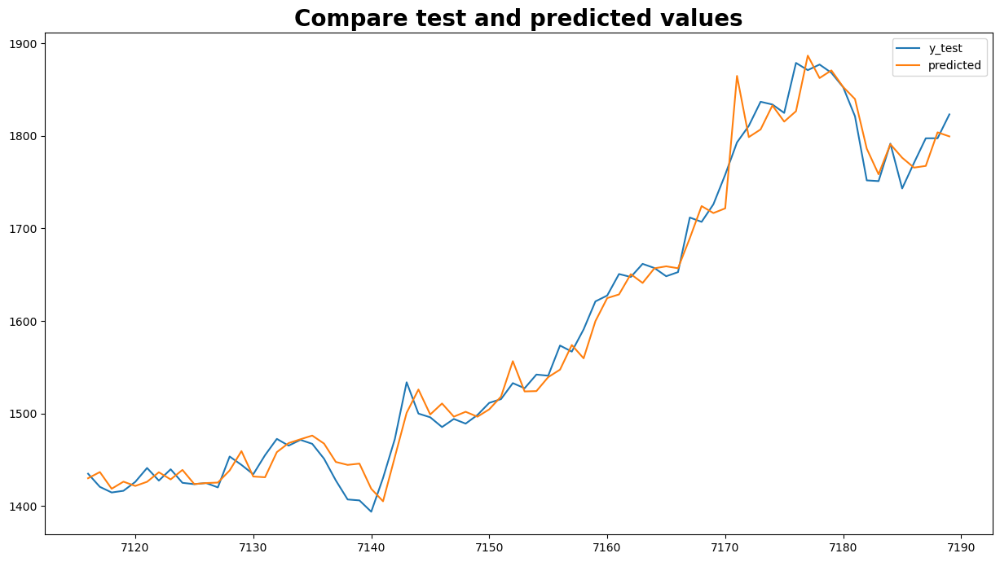

In [367]:
fig=plt.figure(figsize=(15,8))
p=pd.Series(pred_lr, index=y_test_lr.index)
plt.plot(y_test_lr)
plt.plot(p)
plt.legend(['y_test','predicted'])
plt.title("Compare test and predicted values", size=20, weight='bold')


# Prophet Model

The first model (which also can handle multivariate problems) we are going to try is Facebook Prophet.

Prophet, or “Facebook Prophet,” is an open-source library for univariate (one variable) time series forecasting developed by Facebook.

Prophet implements what they refer to as an additive time series forecasting model, and the implementation supports trends, seasonality, and holidays.

In [315]:
# Lets First Take all the Close Price 
closedf = df_copy[['Date','Close']]
print("Shape of close dataframe:", df_copy.shape)

Shape of close dataframe: (7190, 7)


In [316]:
fig = px.line(closedf, x=closedf.Date, y=closedf.Close,labels={'date':'Date','close':'Close Stock'})
fig.update_traces(marker_line_width=2, opacity=0.8, marker_line_color='orange')
fig.update_layout(title_text='Whole period of timeframe of Infosys close price 2014-2024', plot_bgcolor='white', 
                  font_size=15, font_color='black')
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Now we will Take data of just 1 Year¶


In [317]:
closedf = closedf[closedf['Date'] > '2023-08-14']
close_stock = closedf.copy()
print("Total data for prediction: ",closedf.shape[0])

Total data for prediction:  244


In [318]:
closedf

,Date,Close
6946,2023-08-16,1418.500000
6947,2023-08-17,1411.550049
6948,2023-08-18,1388.800049
6949,2023-08-21,1405.400024
6950,2023-08-22,1403.750000
...,...,...
7185,2024-08-08,1743.150024
7186,2024-08-09,1770.750000
7187,2024-08-12,1797.400024
7188,2024-08-13,1797.449951


In [319]:
fig = px.line(closedf, x=closedf.Date, y=closedf.Close,labels={'date':'Date','close':'Close Stock'})
fig.update_traces(marker_line_width=2, opacity=0.8, marker_line_color='orange')
fig.update_layout(title_text='Considered period to predict Infosys close price', 
                  plot_bgcolor='white', font_size=15, font_color='black')
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Normalising data

In [320]:
# deleting date column and normalizing using MinMax Scaler

del closedf['Date']
scaler=MinMaxScaler(feature_range=(0,1))
closedf=scaler.fit_transform(np.array(closedf).reshape(-1,1))
print(closedf.shape)

(244, 1)


In [324]:
train_size = int(0.85 * len(df_copy))
test_size = len(df_copy) - train_size

univariate_df = df_copy[['Date', 'Close']].copy()
univariate_df.columns = ['ds', 'y']

train = univariate_df.iloc[:train_size, :]

x_train, y_train = pd.DataFrame(univariate_df.iloc[:train_size, 0]), pd.DataFrame(univariate_df.iloc[:train_size, 1])
x_valid, y_valid = pd.DataFrame(univariate_df.iloc[train_size:, 0]), pd.DataFrame(univariate_df.iloc[train_size:, 1])

print(len(train), len(x_valid))

6111 1079


In [187]:
import math

from prophet import Prophet


# Train the model
model_P = Prophet()
model_P.fit(train_P)

# x_valid = model.make_future_dataframe(periods=test_size, freq='w')

# Predict on valid set
y_pred_P = model_P.predict(x_valid_P)

# Calcuate metrics
score_mae_P = mean_absolute_error(y_valid_P, y_pred_P.tail(test_size_P)['yhat'])
score_rmse_P = math.sqrt(mean_squared_error(y_valid_P, y_pred_P.tail(test_size_P)['yhat']))
mse_P = mean_squared_error(y_valid_P, y_pred_P.tail(test_size_P)['yhat'])

r2_P = r2_score(y_valid_P, y_pred_P.tail(test_size_P)['yhat'])


# Print results
print(f'MSE_P: {mse_P:.4f}')
print(f'MAE_P: {score_mae_P:.4f}')
print(f'RMSE_P: {score_rmse_P:.4f}')
print(f'R-squared_P: {r2_P:.4f}')



09:13:35 - cmdstanpy - INFO - Chain [1] start processing
09:13:37 - cmdstanpy - INFO - Chain [1] done processing


MSE_P: 422244.1797
MAE_P: 601.8990
RMSE_P: 649.8032
R-squared_P: -4.2544


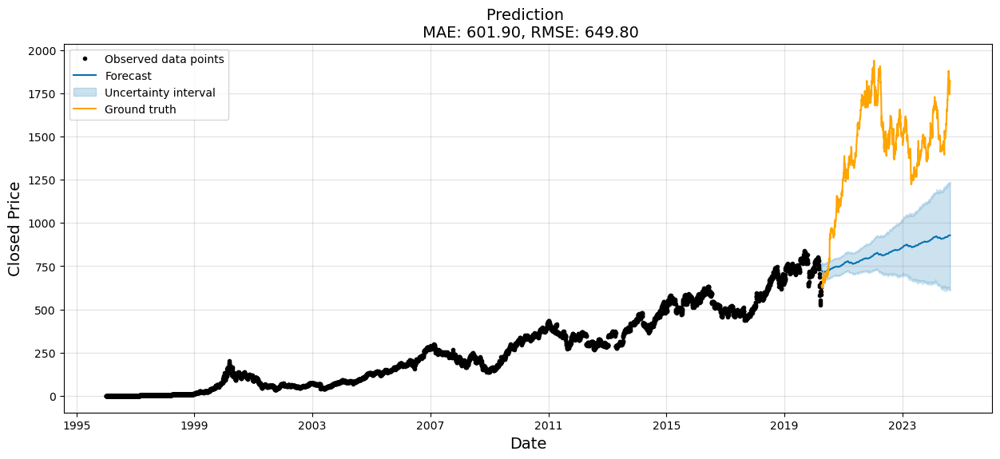

In [188]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(6)
f.set_figwidth(15)

model_P.plot(y_pred_P, ax=ax)
sns.lineplot(x=x_valid_P['ds'], y=y_valid_P['y'], ax=ax, color='orange', label='Ground truth') #navajowhite

ax.set_title(f'Prediction \n MAE: {score_mae_P:.2f}, RMSE: {score_rmse_P:.2f}', fontsize=14)
ax.set_xlabel(xlabel='Date', fontsize=14)
ax.set_ylabel(ylabel='Closed Price', fontsize=14)

plt.show()

# GRU Model Building

 - GRUs (Gated Recurrent Units) are very similar to Long Short Term Memory(LSTM). 
 - Just like LSTM, GRU uses gates to control the flow of information. They are relatively new as compared to LSTM.
 - This is the reason they offer some improvement over LSTM and have simpler architecture.

In [470]:
# Lets First Take all the Close Price 
closedf = df_copy[['Date','Close']]
print("Shape of close dataframe:", df_copy.shape)

Shape of close dataframe: (7190, 7)


In [471]:
fig = px.line(closedf, x=closedf.Date, y=closedf.Close,labels={'date':'Date','close':'Close Stock'})
fig.update_traces(marker_line_width=2, opacity=0.8, marker_line_color='orange')
fig.update_layout(title_text='Whole period of timeframe of Infosys close price 2014-2024', plot_bgcolor='white', 
                  font_size=15, font_color='black')
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Now we will Take data of just 1 Year¶


In [472]:
closedf = closedf[closedf['Date'] > '2023-08-14']
close_stock = closedf.copy()
print("Total data for prediction: ",closedf.shape[0])

Total data for prediction:  244


In [473]:
closedf

,Date,Close
6946,2023-08-16,1418.500000
6947,2023-08-17,1411.550049
6948,2023-08-18,1388.800049
6949,2023-08-21,1405.400024
6950,2023-08-22,1403.750000
...,...,...
7185,2024-08-08,1743.150024
7186,2024-08-09,1770.750000
7187,2024-08-12,1797.400024
7188,2024-08-13,1797.449951


In [474]:
fig = px.line(closedf, x=closedf.Date, y=closedf.Close,labels={'date':'Date','close':'Close Stock'})
fig.update_traces(marker_line_width=2, opacity=0.8, marker_line_color='orange')
fig.update_layout(title_text='Considered period to predict Infosys close price', 
                  plot_bgcolor='white', font_size=15, font_color='black')
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Normalising data

In [475]:
# deleting date column and normalizing using MinMax Scaler

del closedf['Date']
scaler=MinMaxScaler(feature_range=(0,1))
closedf=scaler.fit_transform(np.array(closedf).reshape(-1,1))
print(closedf.shape)

(244, 1)


In [476]:
# we keep the training set as 60% and 40% testing set

training_size_GRU=int(len(closedf)*0.60)
test_size_GRU=len(closedf)-training_size_GRU
train_data_GRU,test_data_GRU=closedf[0:training_size_GRU,:],closedf[training_size_GRU:len(closedf),:1]
print("train_data: ", train_data_GRU.shape)
print("test_data: ", test_data_GRU.shape)

train_data:  (146, 1)
test_data:  (98, 1)


In [477]:
# convert an array of values into a dataset matrix

def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]   ###i=0, 0,1,2,3-----99   100 
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return np.array(dataX), np.array(dataY)

In [478]:
time_step_GRU = 15
X_train_GRU, y_train_GRU = create_dataset(train_data_GRU, time_step_GRU)
X_test_GRU, y_test_GRU = create_dataset(test_data_GRU, time_step_GRU)

print("X_train_GRU: ", X_train_GRU.shape)
print("y_train_GRU: ", y_train_GRU.shape)
print("X_test_GRU: ", X_test_GRU.shape)
print("y_test_GRU", y_test_GRU.shape)

X_train_GRU:  (130, 15)
y_train_GRU:  (130,)
X_test_GRU:  (82, 15)
y_test_GRU (82,)


In [479]:
X_train_GRU

array([[0.12262978, 0.10938547, 0.06603149, ..., 0.17093845, 0.21143392,
        0.23773225],
       [0.10938547, 0.06603149, 0.09766556, ..., 0.21143392, 0.23773225,
        0.23496889],
       [0.06603149, 0.09766556, 0.09452115, ..., 0.23773225, 0.23496889,
        0.21353011],
       ...,
       [0.57436879, 0.62353492, 0.61495941, ..., 0.46965212, 0.49318709,
        0.49023344],
       [0.62353492, 0.61495941, 0.58313483, ..., 0.49318709, 0.49023344,
        0.57008104],
       [0.61495941, 0.58313483, 0.58970929, ..., 0.49023344, 0.57008104,
        0.53330153]])

In [297]:
# reshape input to be [samples, time steps, features] which is required for LSTM
X_train_GRU =X_train_GRU.reshape(X_train_GRU.shape[0],X_train_GRU.shape[1] , 1)
X_test_GRU = X_test_GRU.reshape(X_test_GRU.shape[0],X_test_GRU.shape[1] , 1)

print("X_train_GRU: ", X_train_GRU.shape)
print("X_test_GRU: ", X_test_GRU.shape)

X_train_GRU:  (130, 15, 1)
X_test_GRU:  (82, 15, 1)


### Model Building

In [298]:
tf.keras.backend.clear_session()
model_GRU=Sequential()
model_GRU.add(GRU(32,return_sequences=True,input_shape=(time_step,1)))
model_GRU.add(GRU(32,return_sequences=True))
model_GRU.add(GRU(32))
model_GRU.add(Dropout(0.20))
model_GRU.add(Dense(1))
model_GRU.compile(loss='mean_squared_error',optimizer='adam')

In [299]:
model_GRU.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gru (GRU)                       │ (None, 15, 32)         │         3,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_1 (GRU)                     │ (None, 15, 32)         │         6,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_2 (GRU)                     │ (None, 32)             │         6,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,065 (62.75 KB)

 Trainable params: 16,065 (62.75 KB)

 Non-trainable params: 0 (0.00 B)

In [300]:
history = model_GRU.fit(X_train_GRU,y_train_GRU,validation_data=(X_test_GRU,y_test_GRU),epochs=200,batch_size=32,verbose=1)


Epoch 1/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1579 - val_loss: 0.1075
Epoch 2/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0337 - val_loss: 0.0323
Epoch 3/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0310 - val_loss: 0.0288
Epoch 4/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0239 - val_loss: 0.0319
Epoch 5/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0146 - val_loss: 0.0395
Epoch 6/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0157 - val_loss: 0.0304
Epoch 7/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0110 - val_loss: 0.0173
Epoch 8/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0091 - val_loss: 0.0128
Epoch 9/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0094 - val_loss: 0.0122
Epoch 10/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0083 - val_loss: 0.0121
Epoch 11/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0073 - val_loss: 0.0096
Epoch 12/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0050 - val_l

Epoch 70/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 71/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0045 - val_loss: 0.0039
Epoch 72/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0041 - val_loss: 0.0042
Epoch 73/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0046 - val_loss: 0.0035
Epoch 74/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0034 - val_loss: 0.0037
Epoch 75/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0036 - val_loss: 0.0041
Epoch 76/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0032 - val_loss: 0.0037
Epoch 77/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0042 - val_loss: 0.0036
Epoch 78/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0045 - val_loss: 0.0050
Epoch 79/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0037 - val_loss: 0.0046
Epoch 80/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0047 - val_loss: 0.0039
Epoch 81/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0044

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0036 - val_loss: 0.0041
Epoch 139/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0040 - val_loss: 0.0028
Epoch 140/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0035 - val_loss: 0.0024
Epoch 141/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0031 - val_loss: 0.0037
Epoch 142/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0037 - val_loss: 0.0026
Epoch 143/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0028 - val_loss: 0.0029
Epoch 144/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 145/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0030 - val_loss: 0.0029
Epoch 146/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 147/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0032 - val_loss: 0.0022
Epoch 148/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 149/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0032 -

### Plotting Loss Chart

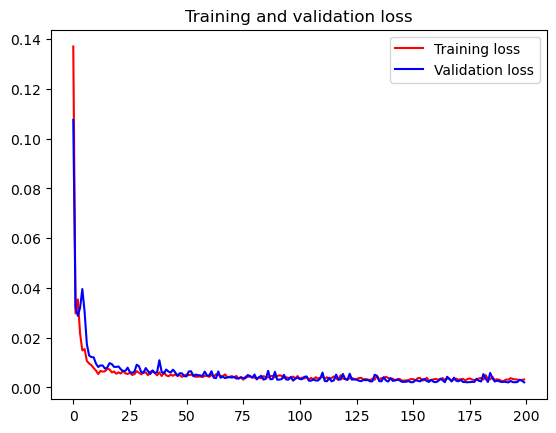

<Figure size 640x480 with 0 Axes>

In [301]:
import matplotlib.pyplot as plt

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(loss))

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()


plt.show()

In [302]:
### Lets Do the prediction and check performance metrics
train_predict_GRU=model_GRU.predict(X_train_GRU)
test_predict_GRU=model_GRU.predict(X_test_GRU)
train_predict_GRU.shape, test_predict_GRU.shape

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


((130, 1), (82, 1))

In [303]:
# Transform back to original form

train_predict_GRU = scaler.inverse_transform(train_predict_GRU)
test_predict_GRU = scaler.inverse_transform(test_predict_GRU)
original_ytrain_GRU = scaler.inverse_transform(y_train_GRU.reshape(-1,1)) 
original_ytest_GRU = scaler.inverse_transform(y_test_GRU.reshape(-1,1)) 

In [304]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE_GRU: ", math.sqrt(mean_squared_error(original_ytrain_GRU,train_predict_GRU)))
print("Train data MSE_GRU: ", mean_squared_error(original_ytrain_GRU,train_predict_GRU))
print("Train data MAE_GRU: ", mean_absolute_error(original_ytrain_GRU,train_predict_GRU))
print("Train data explained variance regression score_GRU:", explained_variance_score(original_ytrain_GRU, train_predict_GRU))
print("Train data R2 score_GRU:", r2_score(original_ytrain_GRU, train_predict_GRU))

print("-------------------------------------------------------------------------------------")
print("Test data RMSE_GRU: ", math.sqrt(mean_squared_error(original_ytest_GRU,test_predict_GRU)))
print("Test data MSE_GRU: ", mean_squared_error(original_ytest_GRU,test_predict_GRU))
print("Test data MAE_GRU: ", mean_absolute_error(original_ytest_GRU,test_predict_GRU))
print("Test data explained variance regression score_GRU_GRU:", explained_variance_score(original_ytest_GRU, test_predict_GRU))
print("Test data R2 score_GRU:", r2_score(original_ytest_GRU, test_predict_GRU))


Train data RMSE_GRU:  23.77145406927071
Train data MSE_GRU:  565.0820285674471
Train data MAE_GRU:  18.014193021334137
Train data explained variance regression score_GRU: 0.9517133876128648
Train data R2 score_GRU: 0.9464669006469054
-------------------------------------------------------------------------------------
Test data RMSE_GRU:  23.61853656272983
Test data MSE_GRU:  557.8352693650057
Test data MAE_GRU:  18.187985303925316
Test data explained variance regression score_GRU_GRU: 0.9772491185411907
Test data R2 score_GRU: 0.9769244264427039


### Comparision of original stock close price and predicted close price

In [463]:
import numpy as np
import pandas as pd
import plotly.express as px
from itertools import cycle

# Define the look_back period (should be the same as used in model)
look_back_GRU = time_step_GRU

# Flatten predictions if they are 2D
train_predict_GRU = np.array(train_predict_GRU).flatten()
test_predict_GRU= np.array(test_predict_GRU).flatten()

# Ensure the lengths match for train and test predictions
train_len = len(train_predict_GRU)
test_len = len(test_predict_GRU)

# Create empty arrays for the predictions with NaNs
trainPredictPlot_GRU = np.full((len(closedf),), np.nan)
testPredictPlot_GRU = np.full((len(closedf),), np.nan)

# Adjust indices to fit within the bounds of closedf
start_train = 0
end_train = start_train + train_len
if end_train <= len(closedf):
    trainPredictPlot_GRU[start_train:end_train] = train_predict_GRU
else:
    print(f"Error: Train predictions exceed bounds of closedf")

start_test = end_train
end_test = start_test + test_len
if end_test <= len(closedf):
    testPredictPlot_GRU[start_test:end_test] = test_predict_GRU
else:
    print(f"Error: Test predictions exceed bounds of closedf")

# Prepare the DataFrame for plotting
plotdf = pd.DataFrame({
    'Date': df_copy['Date'][-len(closedf):],  # Ensure alignment with closedf
    'original_close': df_copy['Close'][-len(closedf):],
    'train_predicted_close_GRU': trainPredictPlot_GRU,
    'test_predicted_close_GRU': testPredictPlot_GRU
})

# Plotting
names = cycle(['Original close price_GRU', 'Train predicted close price_GRU', 'Test predicted close price_GRU'])

fig = px.line(plotdf, x='Date', y=['original_close', 'train_predicted_close_GRU', 'test_predicted_close_GRU'],
              labels={'value': 'Stock price', 'Date': 'Date'})
fig.update_layout(title_text='Comparison between Original Close Price vs Predicted Close Price',
                  plot_bgcolor='white', font_size=15, font_color='black', legend_title_text='Close Price')
fig.for_each_trace(lambda t: t.update(name=next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()


In [464]:
import numpy as np
import pandas as pd
import plotly.express as px
from itertools import cycle

# Define the look_back period (should be the same as used in model)
look_back_GRU = time_step_GRU

# Flatten predictions if they are 2D
train_predict_GRU = np.array(train_predict_GRU).flatten()
test_predict_GRU= np.array(test_predict_GRU).flatten()

# Ensure the lengths match for train and test predictions
train_len = len(train_predict_GRU)
test_len = len(test_predict_GRU)

# Create empty arrays for the predictions with NaNs
trainPredictPlot_GRU = np.full((len(closedf),), np.nan)
testPredictPlot_GRU = np.full((len(closedf),), np.nan)

# Adjust indices to fit within the bounds of closedf
start_train = 0
end_train = start_train + train_len
if end_train <= len(closedf):
    trainPredictPlot_GRU[start_train:end_train] = train_predict_GRU
else:
    print(f"Error: Train predictions exceed bounds of closedf")

start_test = end_train
end_test = start_test + test_len
if end_test <= len(closedf):
    testPredictPlot_GRU[start_test:end_test] = test_predict_GRU
else:
    print(f"Error: Test predictions exceed bounds of closedf")

# Prepare the DataFrame for plotting
plotdf = pd.DataFrame({
    'Date': df_copy['Date'][-len(closedf):],  # Ensure alignment with closedf
    'original_close': df_copy['Close'][-len(closedf):],
    'train_predicted_close_GRU': trainPredictPlot_GRU,
    'test_predicted_close_GRU': testPredictPlot_GRU
})

# Plotting with defined colors
colors = cycle(['#1f77b4', '#ff7f0e', '#2ca02c'])  # Define the colors for each line

fig = px.line(plotdf, x='Date', y=['original_close', 'train_predicted_close_GRU', 'test_predicted_close_GRU'],
              labels={'value': 'Stock price', 'Date': 'Date'})

# Update each trace with the defined colors and names
fig.for_each_trace(lambda t: t.update(name=next(names), line=dict(color=next(colors))))

# Update layout
fig.update_layout(title_text='Comparison between Original Close Price vs Predicted Close Price',
                  plot_bgcolor='white', font_size=15, font_color='black', legend_title_text='Close Price')
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()


### Predicting next 30days

In [462]:
import numpy as np
from numpy import array

# Define parameters
n_steps = time_step_GRU # Length of the input sequence for the model
pred_days = 30  # Number of days to predict

# Initialize input data and prepare for prediction
x_input_GRU = test_data_GRU[len(test_data_GRU)-n_steps:].reshape(1, -1)
temp_input_GRU = x_input_GRU.flatten().tolist()  # Flatten to 1D and convert to list

lst_output = []
i = 0

while i < pred_days:
    if len(temp_input_GRU) >= n_steps:
        # Prepare the input for prediction
        x_input_GRU = np.array(temp_input_GRU[-n_steps:]).reshape(1, n_steps, 1)
        yhat_GRU = model_GRU.predict(x_input_GRU, verbose=0)

        # Update the input list and output list
        temp_input_GRU.extend(yhat_GRU[0].tolist())
        temp_input_GRU = temp_input_GRU[-n_steps:]  # Keep only the last n_steps elements

        lst_output.extend(yhat_GRU.tolist())
    else:
        # If there are not enough elements, reshape the input accordingly
        x_input_GRU = np.array(temp_input_GRU).reshape(1, n_steps, 1)
        yhat_GRU = model_GRU.predict(x_input_GRU, verbose=0)

        # Update the input list and output list
        temp_input_GRU.extend(yhat_GRU[0].tolist())
        temp_input_GRU = temp_input_GRU[-n_steps:]  # Keep only the last n_steps elements

        lst_output.extend(yhat_GRU.tolist())
    
    i += 1

print("Output of predicted next days: ", len(lst_output))


Output of predicted next days:  30


### Plotting last 15 days of dataset and next predicted 30 days

In [311]:
last_days_GRU=np.arange(1,time_step_GRU+1)
day_pred_GRU=np.arange(time_step_GRU+1,time_step_GRU+pred_days+1)
print(last_days_GRU)
print(day_pred_GRU)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]
[16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39
 40 41 42 43 44 45]


In [312]:
temp_mat = np.empty((len(last_days_GRU)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})

names = cycle(['Last 15 days close price','Predicted next 30 days close price'])

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 15 days vs next 30 days',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')

fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Plotting entire Closing Stock Price with next 30 days period of prediction

In [314]:
GRUdf=closedf.tolist()
GRUdf.extend((np.array(lst_output).reshape(-1,1)).tolist())
GRUdf=scaler.inverse_transform(GRUdf).reshape(1,-1).tolist()[0]

names = cycle(['Close price'])

fig = px.line(GRUdf,labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing stock price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')

fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

# LSTM Model building

In [247]:
# Lets First Take all the Close Price 
closedf = df_copy[['Date','Close']]
print("Shape of close dataframe:", df_copy.shape)

Shape of close dataframe: (7190, 7)


In [253]:
fig = px.line(closedf, x=closedf.Date, y=closedf.Close,labels={'date':'Date','close':'Close Stock'})
fig.update_traces(marker_line_width=2, opacity=0.8, marker_line_color='orange')
fig.update_layout(title_text='Whole period of timeframe of Infosys close price 2014-2024', plot_bgcolor='white', 
                  font_size=15, font_color='black')
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Now we will Take data of just 1 Year¶


In [251]:
closedf = closedf[closedf['Date'] > '2023-08-14']
close_stock = closedf.copy()
print("Total data for prediction: ",closedf.shape[0])

Total data for prediction:  244


In [252]:
closedf

,Date,Close
6946,2023-08-16,1418.500000
6947,2023-08-17,1411.550049
6948,2023-08-18,1388.800049
6949,2023-08-21,1405.400024
6950,2023-08-22,1403.750000
...,...,...
7185,2024-08-08,1743.150024
7186,2024-08-09,1770.750000
7187,2024-08-12,1797.400024
7188,2024-08-13,1797.449951


In [254]:
fig = px.line(closedf, x=closedf.Date, y=closedf.Close,labels={'date':'Date','close':'Close Stock'})
fig.update_traces(marker_line_width=2, opacity=0.8, marker_line_color='orange')
fig.update_layout(title_text='Considered period to predict Infosys close price', 
                  plot_bgcolor='white', font_size=15, font_color='black')
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Normalising data

In [255]:
# deleting date column and normalizing using MinMax Scaler

del closedf['Date']
scaler=MinMaxScaler(feature_range=(0,1))
closedf=scaler.fit_transform(np.array(closedf).reshape(-1,1))
print(closedf.shape)

(244, 1)


In [256]:
# we keep the training set as 60% and 40% testing set

training_size_ls=int(len(closedf)*0.60)
test_size_ls=len(closedf)-training_size_ls
train_data_ls,test_data_ls=closedf[0:training_size_ls,:],closedf[training_size_ls:len(closedf),:1]
print("train_data: ", train_data_ls.shape)
print("test_data: ", test_data_ls.shape)

train_data:  (146, 1)
test_data:  (98, 1)


In [257]:
# convert an array of values into a dataset matrix

def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]   ###i=0, 0,1,2,3-----99   100 
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return np.array(dataX), np.array(dataY)

In [258]:
time_step_ls = 15
X_train_ls, y_train_ls = create_dataset(train_data_ls, time_step_ls)
X_test_ls, y_test_ls = create_dataset(test_data_ls, time_step_ls)

print("X_train_ls: ", X_train_ls.shape)
print("y_train_ls: ", y_train_ls.shape)
print("X_test_ls: ", X_test_ls.shape)
print("y_test_ls", y_test_ls.shape)

X_train_ls:  (130, 15)
y_train_ls:  (130,)
X_test_ls:  (82, 15)
y_test_ls (82,)


In [259]:
# reshape input to be [samples, time steps, features] which is required for LSTM
X_train_ls =X_train_ls.reshape(X_train_ls.shape[0],X_train_ls.shape[1] , 1)
X_test_ls = X_test_ls.reshape(X_test_ls.shape[0],X_test_ls.shape[1] , 1)

print("X_train_ls: ", X_train_ls.shape)
print("X_test_ls: ", X_test_ls.shape)

X_train_ls:  (130, 15, 1)
X_test_ls:  (82, 15, 1)


### LSTM model building

In [262]:
model_ls=Sequential()

model_ls.add(LSTM(10,input_shape=(None,1),activation="relu"))

model_ls.add(Dense(1))

model_ls.compile(loss="mean_squared_error",optimizer="adam")

In [263]:
history = model_ls.fit(X_train_ls,y_train_ls,validation_data=(X_test_ls,y_test_ls),epochs=200,batch_size=32,verbose=1)

Epoch 1/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - loss: 0.1923 - val_loss: 0.2917
Epoch 2/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.1588 - val_loss: 0.2729
Epoch 3/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.1513 - val_loss: 0.2540
Epoch 4/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.1307 - val_loss: 0.2356
Epoch 5/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.1316 - val_loss: 0.2179
Epoch 6/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1255 - val_loss: 0.2006
Epoch 7/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1090 - val_loss: 0.1827
Epoch 8/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0954 - val_loss: 0.1647
Epoch 9/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0855 - val_loss: 0.1473
Epoch 10/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0760 - val_loss: 0.1300
Epoch 11/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0628 - val_loss: 0.1134
Epoch 12/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0569 - val_loss: 0.

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0042 - val_loss: 0.0099
Epoch 71/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0041 - val_loss: 0.0094
Epoch 72/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0040 - val_loss: 0.0092
Epoch 73/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0042 - val_loss: 0.0091
Epoch 74/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0043 - val_loss: 0.0087
Epoch 75/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0043 - val_loss: 0.0087
Epoch 76/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0041 - val_loss: 0.0083
Epoch 77/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0039 - val_loss: 0.0080
Epoch 78/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0039 - val_loss: 0.0077
Epoch 79/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0033 - val_loss: 0.0074
Epoch 80/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0040 - val_loss: 0.0073
Epoch 81/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0036 - val_loss: 0.0070
Epoch

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0027 - val_loss: 0.0065
Epoch 140/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0026 - val_loss: 0.0081
Epoch 141/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0028 - val_loss: 0.0071
Epoch 142/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0026 - val_loss: 0.0060
Epoch 143/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0028 - val_loss: 0.0061
Epoch 144/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0025 - val_loss: 0.0067
Epoch 145/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0027 - val_loss: 0.0069
Epoch 146/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0026 - val_loss: 0.0093
Epoch 147/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0027 - val_loss: 0.0074
Epoch 148/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0024 - val_loss: 0.0066
Epoch 149/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0027 - val_loss: 0.0060
Epoch 150/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0029 - val_loss: 0

### Plotting Loss vs Validation loss

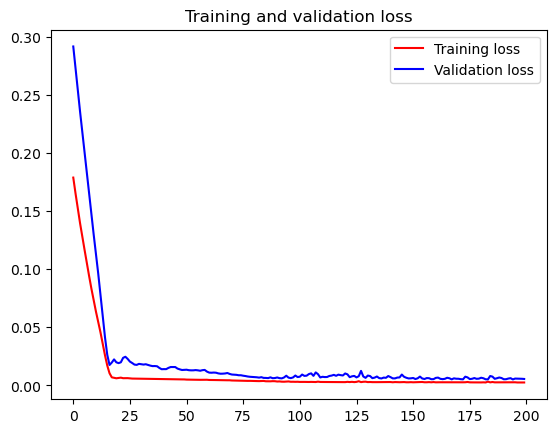

<Figure size 640x480 with 0 Axes>

In [264]:
import matplotlib.pyplot as plt

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(loss))

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()


plt.show()

In [268]:
### Lets Do the prediction and check performance metrics
train_predict_ls=model_ls.predict(X_train_ls)
test_predict_ls=model_ls.predict(X_test_ls)
train_predict_ls.shape, test_predict_ls.shape

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


((130, 1), (82, 1))

### Transform back to original form


In [269]:
 train_predict_ls = scaler.inverse_transform(train_predict_ls)
test_predict_ls = scaler.inverse_transform(test_predict_ls)
original_ytrain_ls = scaler.inverse_transform(y_train_ls.reshape(-1,1)) 
original_ytest_ls = scaler.inverse_transform(y_test_ls.reshape(-1,1))

In [270]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE_ls: ", math.sqrt(mean_squared_error(original_ytrain_ls,train_predict_ls)))
print("Train data MSE_ls: ", mean_squared_error(original_ytrain_ls,train_predict_ls))
print("Train data MAE_ls: ", mean_absolute_error(original_ytrain_ls,train_predict_ls))
print("Train data explained variance regression score_ls:", explained_variance_score(original_ytrain_ls, train_predict_ls))
print("Train data R2 score_ls:", r2_score(original_ytrain_ls, train_predict_ls))

print("-------------------------------------------------------------------------------------")
print("Test data RMSE_ls: ", math.sqrt(mean_squared_error(original_ytest_ls,test_predict_ls)))
print("Test data MSE_ls: ", mean_squared_error(original_ytest_ls,test_predict_ls))
print("Test data MAE_ls: ", mean_absolute_error(original_ytest_ls,test_predict_ls))
print("Test data explained variance regression score_ls:", explained_variance_score(original_ytest_ls, test_predict_ls))
print("Test data R2 score_ls:", r2_score(original_ytest_ls, test_predict_ls))


Train data RMSE_ls:  26.189405771840292
Train data MSE_ls:  685.8849746821016
Train data MAE_ls:  19.18778170072115
Train data explained variance regression score_ls: 0.935024454901336
Train data R2 score_ls: 0.9350226221358778
-------------------------------------------------------------------------------------
Test data RMSE_ls:  39.06516196286041
Test data MSE_ls:  1526.0868791845155
Test data MAE_ls:  27.49342755573553
Test data explained variance regression score_ls: 0.9400028253014918
Test data R2 score_ls: 0.9368714529729665


In [275]:
import numpy as np
import pandas as pd
import plotly.express as px
from itertools import cycle

# Define the look_back period (should be the same as used in model)
look_back_ls = time_step

# Flatten predictions if they are 2D
train_predict_ls = np.array(train_predict_ls).flatten()
test_predict_ls = np.array(test_predict_ls).flatten()

# Ensure the lengths match for train and test predictions
train_len = len(train_predict_ls)
test_len = len(test_predict_ls)

# Create empty arrays for the predictions with NaNs
trainPredictPlot_ls = np.full((len(closedf),), np.nan)
testPredictPlot_ls = np.full((len(closedf),), np.nan)

# Adjust indices to fit within the bounds of closedf
start_train = 0
end_train = start_train + train_len
if end_train <= len(closedf):
    trainPredictPlot_ls[start_train:end_train] = train_predict_ls
else:
    print(f"Error: Train predictions exceed bounds of closedf")

start_test = end_train
end_test = start_test + test_len
if end_test <= len(closedf):
    testPredictPlot_ls[start_test:end_test] = test_predict_ls
else:
    print(f"Error: Test predictions exceed bounds of closedf")

# Prepare the DataFrame for plotting
plotdf = pd.DataFrame({
    'Date': df_copy['Date'][-len(closedf):],  # Ensure alignment with closedf
    'original_close': df_copy['Close'][-len(closedf):],
    'train_predicted_close_ls': trainPredictPlot_ls,
    'test_predicted_close_ls': testPredictPlot_ls
})

# Plotting
names = cycle(['Original close price_ls', 'Train predicted close price_ls', 'Test predicted close price_ls'])

fig = px.line(plotdf, x='Date', y=['original_close', 'train_predicted_close_ls', 'test_predicted_close_ls'],
              labels={'value': 'Stock price', 'Date': 'Date'})
fig.update_layout(title_text='Comparison between Original Close Price vs Predicted Close Price',
                  plot_bgcolor='white', font_size=15, font_color='black', legend_title_text='Close Price')
fig.for_each_trace(lambda t: t.update(name=next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()


### Predicting next 30days

In [310]:
import numpy as np
from numpy import array

# Define parameters
n_steps = time_step_ls  # Length of the input sequence for the model
pred_days = 30  # Number of days to predict

# Initialize input data and prepare for prediction
x_input_ls = test_data_ls[len(test_data_ls)-n_steps:].reshape(1, -1)
temp_input_ls = x_input_ls.flatten().tolist()  # Flatten to 1D and convert to list

lst_output = []
i = 0

while i < pred_days:
    if len(temp_input_ls) >= n_steps:
        # Prepare the input for prediction
        x_input_ls = np.array(temp_input_ls[-n_steps:]).reshape(1, n_steps, 1)
        yhat_ls = model_ls.predict(x_input_ls, verbose=0)

        # Update the input list and output list
        temp_input_ls.extend(yhat_ls[0].tolist())
        temp_input_ls = temp_input_ls[-n_steps:]  # Keep only the last n_steps elements

        lst_output.extend(yhat_ls.tolist())
    else:
        # If there are not enough elements, reshape the input accordingly
        x_input_ls = np.array(temp_input_ls).reshape(1, n_steps, 1)
        yhat_ls = model_ls.predict(x_input_ls, verbose=0)

        # Update the input list and output list
        temp_input_ls.extend(yhat_ls[0].tolist())
        temp_input_ls = temp_input_ls[-n_steps:]  # Keep only the last n_steps elements

        lst_output.extend(yhat_ls.tolist())
    
    i += 1

print("Output of predicted next days: ", len(lst_output))


Output of predicted next days:  30


### Plotting last 15 days of dataset and next predicted 30 days

In [278]:
last_days_ls=np.arange(1,time_step_ls+1)
day_pred_ls=np.arange(time_step_ls+1,time_step_ls+pred_days+1)
print(last_days_ls)
print(day_pred_ls)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]
[16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39
 40 41 42 43 44 45]


In [279]:
temp_mat = np.empty((len(last_days_ls)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})

names = cycle(['Last 15 days close price','Predicted next 30 days close price'])

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 15 days vs next 30 days',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')

fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Plotting entire Closing Stock Price with next 30 days period of prediction

In [280]:
lstmdf=closedf.tolist()
lstmdf.extend((np.array(lst_output).reshape(-1,1)).tolist())
lstmdf=scaler.inverse_transform(lstmdf).reshape(1,-1).tolist()[0]

names = cycle(['Close price'])

fig = px.line(lstmdf,labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing stock price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')

fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()